# Google Cloud CMIP6 Public Data: Basic Python Example

This notebooks shows how to query the catalog and load the data using python

In [1]:
%%capture
! pip install --upgrade zarr gcsfs cftime xarray nc-time-axis #netCDF4 esgf-pyclient

from matplotlib import pyplot as plt
import numpy as np; import pandas as pd
import xarray as xr
import zarr; import gcsfs
#from pyesgf.search import SearchConnection
from sklearn.linear_model import LinearRegression

xr.set_options(display_style='html')
%matplotlib inline
%config InlineBackend.figure_format = 'retina' 
plt.rcParams['figure.figsize'] = 12, 6
# this only needs to be created once
gcs = gcsfs.GCSFileSystem(token='anon')
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········


## Browse Catalog

The data catatalog is stored as a CSV file. Here we read it with Pandas.

The columns of the dataframe correspond to the CMI6 controlled vocabulary. A beginners' guide to these terms is available in [this document](https://docs.google.com/document/d/1yUx6jr9EdedCOLd--CPdTfGDwEwzPpCF6p1jRmqx-0Q). 

Here we filter the data to find monthly surface air temperature for historical experiments.

In [2]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#here we filter the data to find monthly surface air temperature for historical experiments.
df_ta = df.query("activity_id=='CMIP' & table_id == 'Amon' & variable_id == 'tas'  & experiment_id == 'historical' ")
#Now we do further filtering to find just the models from NCAR.
df_ta_ncar = df_ta.query('institution_id == "NCAR"')
df_ta_ncar

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year
43259,CMIP,NCAR,CESM2-FV2,historical,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r1i1...,NaN
43452,CMIP,NCAR,CESM2-FV2,historical,r2i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r2i1...,NaN
43473,CMIP,NCAR,CESM2-FV2,historical,r3i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r3i1...,NaN
43676,CMIP,NCAR,CESM2-WACCM-FV2,historical,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM-FV2/historica...,NaN
43936,CMIP,NCAR,CESM2-WACCM-FV2,historical,r2i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM-FV2/historica...,NaN
43957,CMIP,NCAR,CESM2-WACCM-FV2,historical,r3i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM-FV2/historica...,NaN
44686,CMIP,NCAR,CESM2-WACCM,historical,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM/historical/r1...,NaN
45012,CMIP,NCAR,CESM2-WACCM,historical,r2i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM/historical/r2...,NaN
45253,CMIP,NCAR,CESM2-WACCM,historical,r3i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM/historical/r3...,NaN
46320,CMIP,NCAR,CESM2,historical,r10i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2/historical/r10i1p1f...,NaN


In [3]:
df_ta_ncar.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year
43259,CMIP,NCAR,CESM2-FV2,historical,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r1i1...,NaN
43452,CMIP,NCAR,CESM2-FV2,historical,r2i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r2i1...,NaN
43473,CMIP,NCAR,CESM2-FV2,historical,r3i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-FV2/historical/r3i1...,NaN
43676,CMIP,NCAR,CESM2-WACCM-FV2,historical,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM-FV2/historica...,NaN
43936,CMIP,NCAR,CESM2-WACCM-FV2,historical,r2i1p1f1,Amon,tas,gn,gs://cmip6/CMIP/NCAR/CESM2-WACCM-FV2/historica...,NaN


## Load Data

Now we will load a single store using gcsfs, zarr, and xarray.

In [4]:
# get the path to a specific zarr store (the first one from the dataframe above)
zstore = df_ta_ncar.zstore.values[-1]

# create a mutable-mapping-style interface to the store
mapper = gcs.get_mapper(zstore)

# open it using xarray and zarr
ds = xr.open_zarr(mapper, consolidated=True)
ds

<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, nbnd: 2, time: 1980)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
    lat_bnds   (lat, nbnd) float32 dask.array<chunksize=(192, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lon_bnds   (lon, nbnd) float32 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * time       (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00
    time_bnds  (time, nbnd) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Dimensions without coordinates: nbnd
Data variables:
    tas        (time, lat, lon) float32 dask.array<chunksize=(600, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  295650.0
    case_id:                23
    cesm_casename:          b.e21.BHIST.f09_g17.CMIP6-historical.009
    contact:                cesm_cmip6@ucar.edu
    creation_date:          2019-01-27T10:42:54Z
    data_specs_version:     01.00.29
    experiment:             all-forcing simulation of the recent past
    experiment_id:          historical
    external_variables:     areacella
    forcing_index:          1
    frequency:              mon
    further_info_url:       https://furtherinfo.es-doc.org/CMIP6.NCAR.CESM2.h...
    grid:                   native 0.9x1.25 finite volume grid (192x288 latxlon)
    grid_label:             gn
    history:                none
    initialization_index:   1
    institution:            National Center for Atmospheric Research, Climate...
    institution_id:         NCAR
    license:                CMIP6 model data produced by <The National Center...
    mip_era:                CMIP6
    model_doi_url:          https://doi.org/10.5065/D67H1H0V
    nominal_resolution:     100 km
    parent_activity_id:     CMIP
    parent_experiment_id:   piControl
    parent_mip_era:         CMIP6
    parent_source_id:       CESM2
    parent_time_units:      days since 0001-01-01 00:00:00
    parent_variant_label:   r1i1p1f1
    physics_index:          1
    product:                model-output
    realization_index:      9
    realm:                  atmos
    source:                 CESM2 (2017): atmosphere: CAM6 (0.9x1.25 finite v...
    source_id:              CESM2
    source_type:            AOGCM BGC
    sub_experiment:         none
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/4b164514-1627-4deb-a8d5-93d4c5166d41...
    variable_id:            tas
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r9i1p1f1
    status:                 2019-10-25;created;by nhn2@columbia.edu

In [5]:
ds.info

<bound method Dataset.info of <xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, nbnd: 2, time: 1980)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
    lat_bnds   (lat, nbnd) float32 dask.array<chunksize=(192, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lon_bnds   (lon, nbnd) float32 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * time       (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00
    time_bnds  (time, nbnd) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Dimensions without coordinates: nbnd
Data variables:
    tas        (time, lat, lon) float32 dask.array<chunksize=(600, 192, 288), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  295650.0
    case_id:                23
    cesm_casename:       

Plot a map from a specific date.

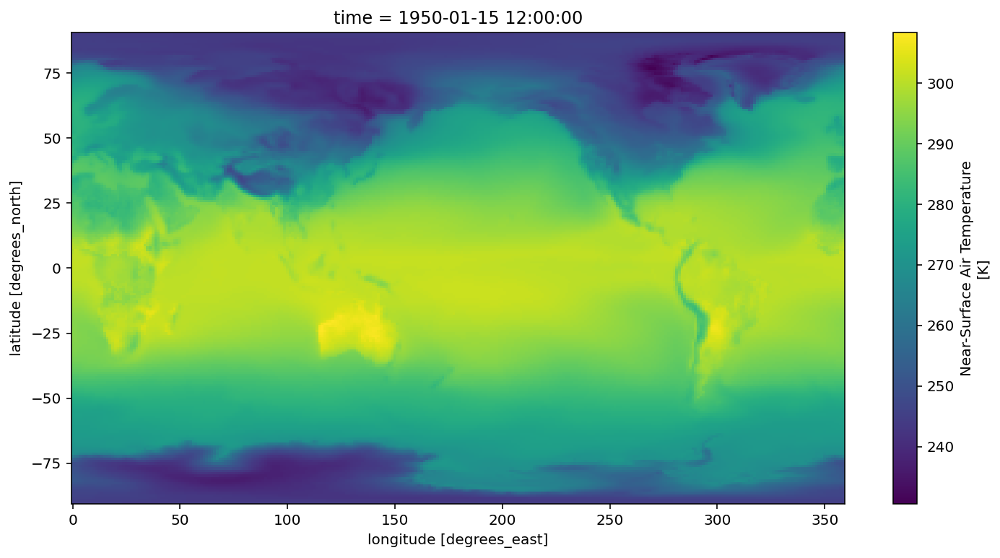

In [202]:
ds.tas.sel(time = '1950-01' ).squeeze().plot()

In [0]:
t = ds.tas.values

In [204]:
grid = np.meshgrid(ds.lon.values, ds.lat.values)
grid

[array([[  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
        [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
        [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
        ...,
        [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
        [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
        [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75]]),
 array([[-90.        , -90.        , -90.        , ..., -90.        ,
         -90.        , -90.        ],
        [-89.05759162, -89.05759162, -89.05759162, ..., -89.05759162,
         -89.05759162, -89.05759162],
        [-88.11518325, -88.11518325, -88.11518325, ..., -88.11518325,
         -88.11518325, -88.11518325],
        ...,
        [ 88.11518325,  88.11518325,  88.11518325, ...,  88.11518325,
          88.11518325,  88.11518325],
        [ 89.05759162,  89.05759162,  89.05759162, ...,  89.05759162,
          89.05759162,  89.05759162],
        [ 90.        ,  90.        ,  90.        , ...

In [0]:
lat = grid[1]
lon = grid[0]

In [206]:
lat

array([[-90.        , -90.        , -90.        , ..., -90.        ,
        -90.        , -90.        ],
       [-89.05759162, -89.05759162, -89.05759162, ..., -89.05759162,
        -89.05759162, -89.05759162],
       [-88.11518325, -88.11518325, -88.11518325, ..., -88.11518325,
        -88.11518325, -88.11518325],
       ...,
       [ 88.11518325,  88.11518325,  88.11518325, ...,  88.11518325,
         88.11518325,  88.11518325],
       [ 89.05759162,  89.05759162,  89.05759162, ...,  89.05759162,
         89.05759162,  89.05759162],
       [ 90.        ,  90.        ,  90.        , ...,  90.        ,
         90.        ,  90.        ]])

In [207]:
lat.shape

(192, 288)

In [208]:
lon

array([[  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
       [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
       [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
       ...,
       [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
       [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75],
       [  0.  ,   1.25,   2.5 , ..., 356.25, 357.5 , 358.75]])

In [0]:
f = lambda x: x-360 if x>180 else x
df_latlon['j'] = df_latlon['j'].map(f)

In [212]:
df_latlon

,i,j,y,lonmod
0,-90.0,0.00,226.202393,-1.25
1,-90.0,1.25,226.202393,-1.25
2,-90.0,2.50,226.202393,-1.25
3,-90.0,3.75,226.202393,-1.25
4,-90.0,5.00,226.202393,-1.25
...,...,...,...,...
55291,90.0,-6.25,257.282715,-1.25
55292,90.0,-5.00,257.284607,-1.25
55293,90.0,-3.75,257.286285,-1.25
55294,90.0,-2.50,257.287811,-1.25


In [180]:
 if ds.lon.values > 180:
   ds.lon.values = ds.lon.values -360

ValueError: ignored

In [145]:
ds.time.shape

(1980,)

In [146]:
ta_timeseries = ds.tas
ta_yearly = ta_timeseries.resample(time='1Y').mean()
y= ta_yearly.values
y[0]

array([[226.2024 , 226.2024 , 226.2024 , ..., 226.2024 , 226.20241,
        226.20241],
       [226.75465, 226.72353, 226.57538, ..., 226.76677, 226.76642,
        226.76117],
       [227.20044, 227.17253, 227.16698, ..., 227.39705, 227.35786,
        227.29822],
       ...,
       [257.77902, 257.7929 , 257.80557, ..., 257.74158, 257.75406,
        257.7656 ],
       [257.53604, 257.5433 , 257.55066, ..., 257.50925, 257.51932,
        257.5281 ],
       [257.29044, 257.2916 , 257.29263, ..., 257.2863 , 257.2878 ,
        257.28915]], dtype=float32)

In [147]:
y[0].shape

(192, 288)

In [148]:
y.dtype

dtype('float32')

In [0]:
#y_grid = np.meshgrid(ds.lon.values, ds.lat.values)
#y_grid

In [149]:
ta_yearly.shape

(165, 192, 288)

In [150]:
lat.shape

(192, 288)

In [152]:
lat.shape

(192, 288)

In [0]:
y_0 = y[0]

In [0]:
df_latlon = pd. DataFrame({ 'i': lat.ravel(), 'j': lon.ravel(),'y': y_0.ravel()})

In [155]:
df_latlon

,i,j,y
0,-90.0,0.00,226.202393
1,-90.0,1.25,226.202393
2,-90.0,2.50,226.202393
3,-90.0,3.75,226.202393
4,-90.0,5.00,226.202393
...,...,...,...
55291,90.0,353.75,257.282715
55292,90.0,355.00,257.284607
55293,90.0,356.25,257.286285
55294,90.0,357.50,257.287811


In [103]:
df['j'] > 180

0        False
1        False
2        False
3        False
4        False
         ...  
55291     True
55292     True
55293     True
55294     True
55295     True
Name: j, Length: 55296, dtype: bool

In [123]:

if df['j']>180:
  df['_longitude_adjusted'] = df['j'] - 360
else:
  df['_longitude_adjusted'] = df['j']




ValueError: ignored

In [160]:
df_latlon

,i,j,y
0,-90.0,0.00,226.202393
1,-90.0,1.25,226.202393
2,-90.0,2.50,226.202393
3,-90.0,3.75,226.202393
4,-90.0,5.00,226.202393
...,...,...,...
55291,90.0,353.75,257.282715
55292,90.0,355.00,257.284607
55293,90.0,356.25,257.286285
55294,90.0,357.50,257.287811


In [163]:
for lat, lon in zip(df_latlon['i'][:5], df_latlon['j'][:5]):

    geometry = lat, lon
    print(geometry)

(-90.0, 0.0)
(-90.0, 1.25)
(-90.0, 2.5)
(-90.0, 3.75)
(-90.0, 5.0)


In [164]:
df_latlon

,i,j,y
0,-90.0,0.00,226.202393
1,-90.0,1.25,226.202393
2,-90.0,2.50,226.202393
3,-90.0,3.75,226.202393
4,-90.0,5.00,226.202393
...,...,...,...
55291,90.0,353.75,257.282715
55292,90.0,355.00,257.284607
55293,90.0,356.25,257.286285
55294,90.0,357.50,257.287811


In [193]:
df_latlon['j'] - 360

0       -360.00
1       -358.75
2       -357.50
3       -356.25
4       -355.00
          ...  
55291     -6.25
55292     -5.00
55293     -3.75
55294     -2.50
55295     -1.25
Name: j, Length: 55296, dtype: float64

In [200]:
df_latlon.loc[df_latlon.j > 180, 'j'] = df_latlon.loc[df_latlon.j]-360

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  """Entry point for launching an IPython kernel.


In [201]:
df_latlon

,i,j,y,lonmod
0,-90.0,0.00,226.202393,-1.25
1,-90.0,1.25,226.202393,-1.25
2,-90.0,2.50,226.202393,-1.25
3,-90.0,3.75,226.202393,-1.25
4,-90.0,5.00,226.202393,-1.25
...,...,...,...,...
55291,90.0,-6.25,257.282715,-1.25
55292,90.0,-5.00,257.284607,-1.25
55293,90.0,-3.75,257.286285,-1.25
55294,90.0,-2.50,257.287811,-1.25


In [185]:
for row in range(len(df_latlon)):
  if df_latlon.loc[row] >180:
    df_latlon['lonmod']= df_latlon.loc[row] -360
  else:
    df_latlon['lonmod']= df_latlon.loc[row]

ValueError: ignored

In [188]:

if df_latlon.iloc['j'] >180:
  df_latlon['lonmod']= df_latlon.iloc['j'] -360
else:
  df_latlon['lonmod']= df_latlon.iloc['j']

TypeError: ignored

In [183]:
df_latlon.tail()

,i,j,y,lonmod
55291,90.0,353.75,257.282715,-1.25
55292,90.0,355.00,257.284607,-1.25
55293,90.0,356.25,257.286285,-1.25
55294,90.0,357.50,257.287811,-1.25
55295,90.0,358.75,257.289154,-1.25


In [172]:
from shapely.geometry import Point
for lat, lon in zip(df_latlon['i'][:5], df_latlon['j'][:5]):
    geometry = Point(lat, lon)
    print(geometry)

POINT (-90 0)
POINT (-90 1.25)
POINT (-90 2.5)
POINT (-90 3.75)
POINT (-90 5)


In [0]:
crs = {'init': 'epsg:4326'}

In [26]:
pip install geopandas

     |████████████████████████████████| 931kB 2.8MB/s 
     |████████████████████████████████| 10.4MB 40.5MB/s 
     |████████████████████████████████| 14.7MB 306kB/s 


In [0]:
geometry = [Point(xy) for xy in zip(df.j, df.i)]
df = df.drop(['i', 'j'], axis=1)
crs = {'init': 'epsg:4326'}

In [128]:
import geopandas as gpd
from shapely.geometry import Point
gdf = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)
gdf.head()

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,y,_longitude_adjusted,geometry
0,226.202393,0.0,POINT (0.00000 -90.00000)
1,226.202393,0.0,POINT (1.25000 -90.00000)
2,226.202393,0.0,POINT (2.50000 -90.00000)
3,226.202393,0.0,POINT (3.75000 -90.00000)
4,226.202393,0.0,POINT (5.00000 -90.00000)


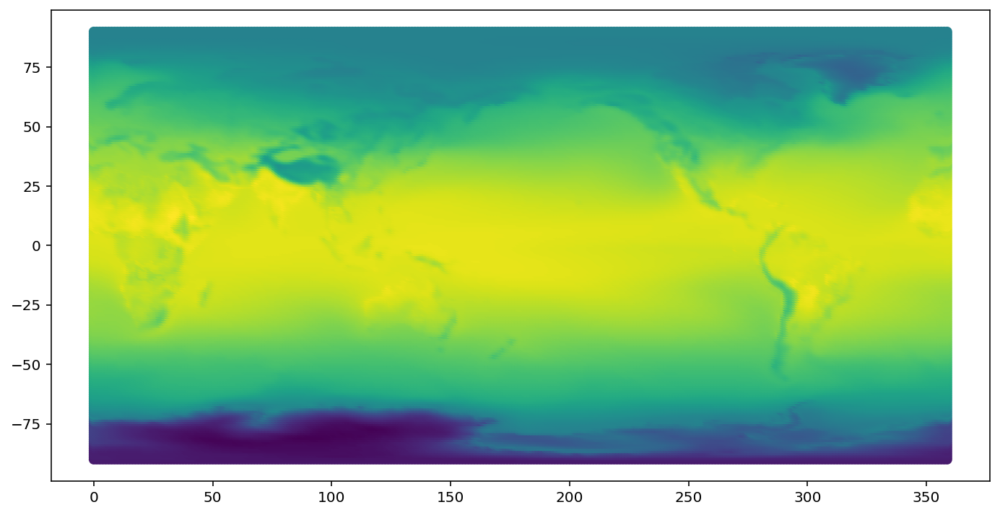

In [129]:
#fig, ax = plt.subplots(figsize=(12,10))
gdf.plot('y')

In [0]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

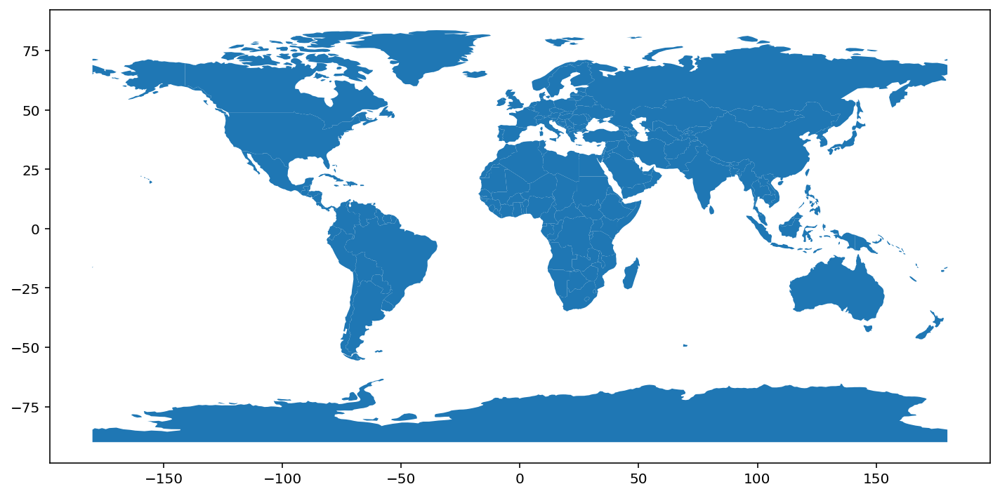

In [33]:
 from mpl_toolkits.axes_grid1 import make_axes_locatable
world.plot()

In [36]:
world.tail()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
176,13026129,Africa,S. Sudan,SSD,20880.0,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ..."


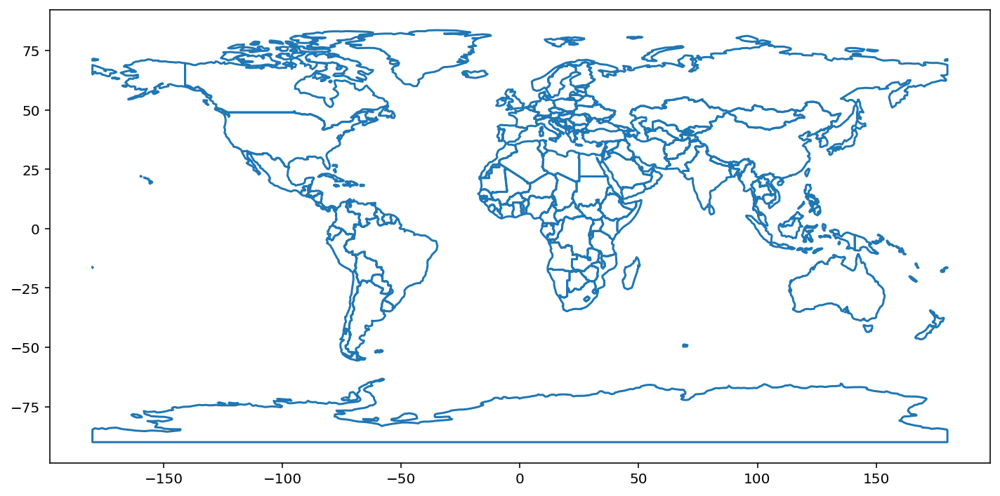

In [37]:
world.boundary.plot();

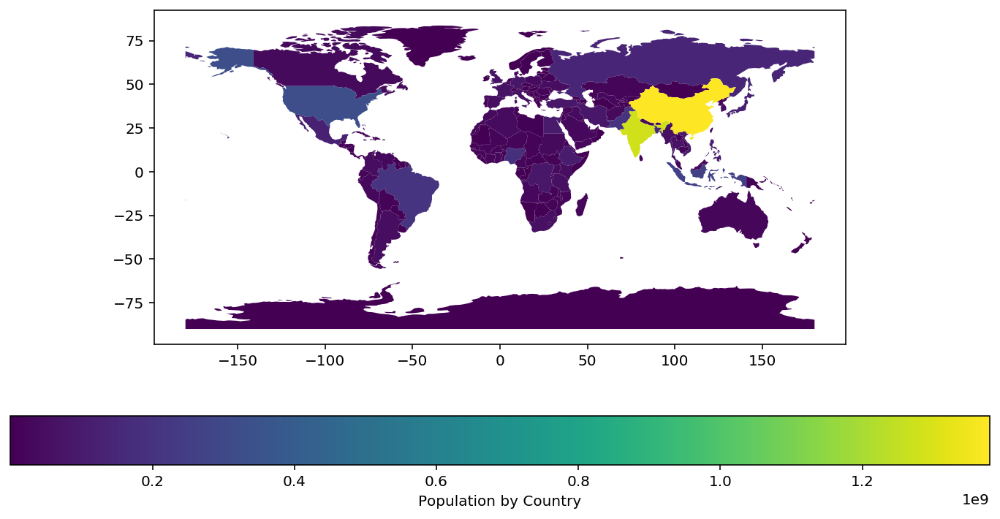

In [0]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)
world.plot(column='pop_est',
             ax=ax,
          legend=True,
           legend_kwds={'label': "Population by Country",
                         'orientation': "horizontal"})
   


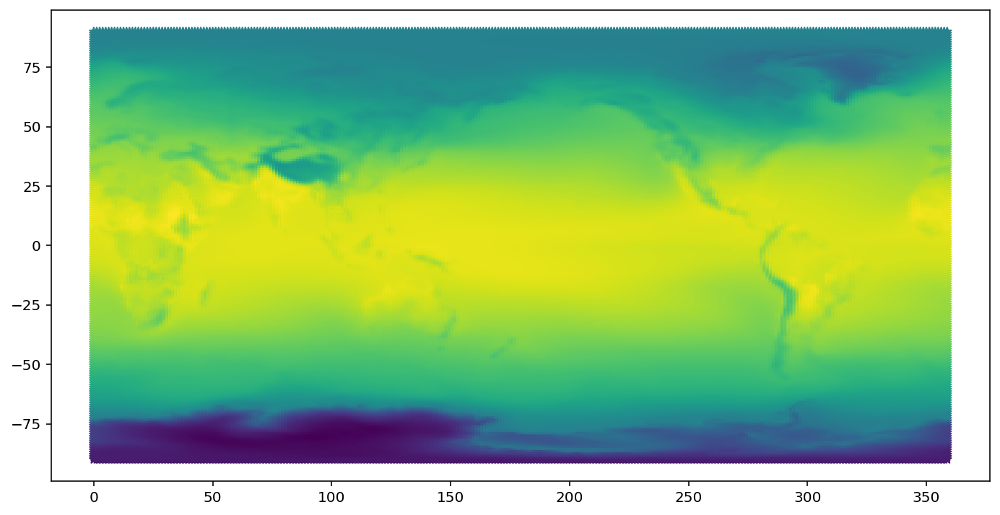

In [75]:
gdf.plot('y',marker='*');

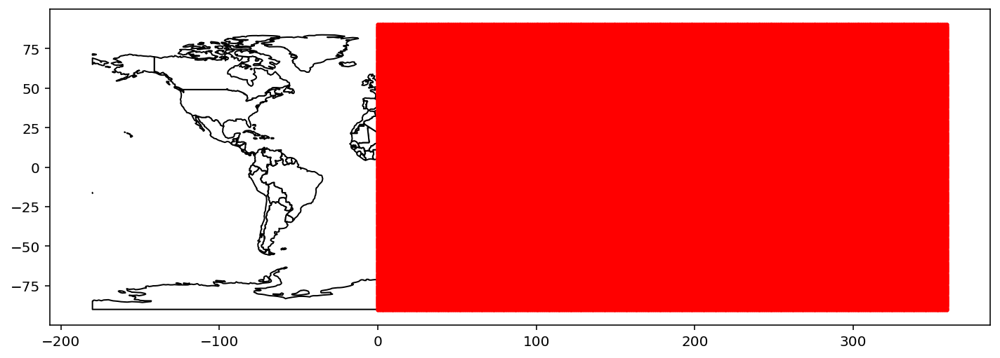

In [0]:
base = world.plot(color='white', edgecolor='black')
gdf.plot(ax=base, marker='o', color='red', markersize=5);

In [0]:
lat = np.repeat(lat[np.newaxis, :, :],165 , axis = 0)
lon = np.repeat(lon[np.newaxis, :, :], 165, axis = 0)

TypeError: ignored

In [0]:
%%capture
#!pip install geopandas
!pip install rasterio
### to get cartopy ###
# get package then extract
!wget https://anaconda.org/conda-forge/cartopy/0.16.0/download/linux-64/cartopy-0.16.0-py36h81b52dc_2.tar.bz2
!tar xvjf cartopy-0.16.0-py36h81b52dc_2.tar.bz2
!cp -r lib/python3.6/site-packages/* /usr/local/lib/python3.6/dist-packages/
# install dependencies
!pip install shapely pyshp
!apt install libproj-dev libgeos-dev
### regionmask
!pip install -qq regionmask
!pip install netcdf4
import geopandas as gpd
import regionmask
import numpy as np
import xarray as xr


In [0]:
### GADM36 country level mask at the same resolution as ERA-5 ###
lon = np.linspace(0, 359.75, 1440)
lat = np.linspace(90, -90, 721)


In [0]:
gdf = gpd.read_file('/content/drive/Shared drives/GEOS39650/climate_emulator/data/gadm36_levels.gpkg', layer='level0')

#'/content/drive/Shared drives/GEOS39650/climate_emulator/data/12_CMIP6_models_global_mean.csv'
countries = regionmask.Regions(gdf.geometry)
countrymask = countries.mask( lon, lat )
xr.DataArray.to_netcdf( countrymask, path = '/content/drive/Shared drives/GEOS39650/climate_emulator/data/gadm36_countries_0.25_degrees.nc4', format = 'NETCDF4' )

Create a timeseries of global-average surface air temperature. For this we need the area weighting factor for each gridpoint.

In [0]:
df_area = df.query("variable_id == 'areacella' & source_id == 'CESM2'")

In [0]:
df_area.values

array([['CFMIP', 'NCAR', 'CESM2', 'amip-4xCO2', 'r1i1p1f1', 'fx',
        'areacella', 'gn',
        'gs://cmip6/CFMIP/NCAR/CESM2/amip-4xCO2/r1i1p1f1/fx/areacella/gn/',
        nan],
       ['CFMIP', 'NCAR', 'CESM2', 'amip-future4K', 'r1i1p1f1', 'fx',
        'areacella', 'gn',
        'gs://cmip6/CFMIP/NCAR/CESM2/amip-future4K/r1i1p1f1/fx/areacella/gn/',
        nan],
       ['CFMIP', 'NCAR', 'CESM2', 'amip-m4K', 'r1i1p1f1', 'fx',
        'areacella', 'gn',
        'gs://cmip6/CFMIP/NCAR/CESM2/amip-m4K/r1i1p1f1/fx/areacella/gn/',
        nan],
       ['CFMIP', 'NCAR', 'CESM2', 'amip-p4K', 'r1i1p1f1', 'fx',
        'areacella', 'gn',
        'gs://cmip6/CFMIP/NCAR/CESM2/amip-p4K/r1i1p1f1/fx/areacella/gn/',
        nan],
       ['CFMIP', 'NCAR', 'CESM2', 'aqua-4xCO2', 'r1i1p1f1', 'fx',
        'areacella', 'gn',
        'gs://cmip6/CFMIP/NCAR/CESM2/aqua-4xCO2/r1i1p1f1/fx/areacella/gn/',
        nan],
       ['CFMIP', 'NCAR', 'CESM2', 'aqua-control', 'r1i1p1f1', 'fx',
        'areacella'

In [0]:
df_area.zstore.values

array(['gs://cmip6/CFMIP/NCAR/CESM2/amip-4xCO2/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/amip-future4K/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/amip-m4K/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/amip-p4K/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/aqua-4xCO2/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/aqua-control/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CFMIP/NCAR/CESM2/aqua-p4K/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/1pctCO2/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/abrupt-4xCO2/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/amip/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/esm-piControl/r1i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/historical/r10i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2/historical/r11i1p1f1/fx/areacella/gn/',
       'gs://cmip6/CMIP/NCAR/CESM2

In [0]:
df_area.shape

(29, 10)

In [0]:
ds_area = xr.open_zarr(gcs.get_mapper(df_area.zstore.values[0]), consolidated=True)
ds_area

<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
    lat_bnds   (lat, nbnd) float64 dask.array<chunksize=(192, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lon_bnds   (lon, nbnd) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
Dimensions without coordinates: nbnd
Data variables:
    areacella  (lat, lon) float32 dask.array<chunksize=(192, 288), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CFMIP
    branch_method:          no parent
    branch_time_in_child:   721970.0
    branch_time_in_parent:  0.0
    case_id:                965
    cesm_casename:          f.e21.FHIST_BGC.f09_f09_mg17.CFMIP-amip-4xCO2.001
    contact:                cesm_cmip6@ucar.edu
    creation_date:          2019-03-13T22:41:31Z
    data_specs_version:     01.00.29
    experiment:             Continuation of CFMIP-2 AMIP experiments and CMIP...
    experiment_id:          amip-4xCO2
    forcing_index:          1
    frequency:              fx
    further_info_url:       https://furtherinfo.es-doc.org/CMIP6.NCAR.CESM2.a...
    grid:                   native 0.9x1.25 finite volume grid (192x288 latxlon)
    grid_label:             gn
    initialization_index:   1
    institution:            National Center for Atmospheric Research, Climate...
    institution_id:         NCAR
    license:                CMIP6 model data produced by <The National Center...
    mip_era:                CMIP6
    model_doi_url:          https://doi.org/10.5065/D67H1H0V
    nominal_resolution:     100 km
    parent_activity_id:     no parent
    parent_experiment_id:   no parent
    parent_mip_era:         no parent
    parent_source_id:       no parent
    parent_time_units:      no parent
    parent_variant_label:   no parent
    physics_index:          1
    product:                model-output
    realization_index:      1
    realm:                  atmos land
    source:                 CESM2 (2017): atmosphere: CAM6 (0.9x1.25 finite v...
    source_id:              CESM2
    source_type:            AGCM AER
    sub_experiment:         none
    sub_experiment_id:      none
    table_id:               fx
    tracking_id:            hdl:21.14100/35b69461-eb69-4a58-b2f7-413dbf2cd8fe
    variable_id:            areacella
    variant_info:           The same as the amip experiment within DECK, exce...
    variant_label:          r1i1p1f1
    status:                 2019-11-04;created;by nhn2@columbia.edu

compute the globally averaged value. By default the data are loaded lazily, as Dask arrays. Here we trigger computation explicitly.

In [0]:
total_area = ds_area.areacella.sum(dim=['lon', 'lat'])
ta_timeseries = (ds.tas * ds_area.areacella).sum(dim=['lon', 'lat']) / total_area
ta_timeseries.load()

<xarray.DataArray (time: 1980)>
array([285.6408 , 285.57397, 286.33856, ..., 288.6992 , 287.76303,
       287.0621 ], dtype=float32)
Coordinates:
  * time     (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00

In [0]:
ds_area

<xarray.Dataset>
Dimensions:    (lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
    lat_bnds   (lat, nbnd) float64 dask.array<chunksize=(192, 2), meta=np.ndarray>
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    lon_bnds   (lon, nbnd) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
Dimensions without coordinates: nbnd
Data variables:
    areacella  (lat, lon) float32 dask.array<chunksize=(192, 288), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CFMIP
    branch_method:          no parent
    branch_time_in_child:   721970.0
    branch_time_in_parent:  0.0
    case_id:                965
    cesm_casename:          f.e21.FHIST_BGC.f09_f09_mg17.CFMIP-amip-4xCO2.001
    contact:                cesm_cmip6@ucar.edu
    creation_date:          2019-03-13T22:41:31Z
    data_specs_version:     01.00.29
    experiment:             Continuation of CFMIP-2 AMIP experiments and CMIP...
    experiment_id:          amip-4xCO2
    forcing_index:          1
    frequency:              fx
    further_info_url:       https://furtherinfo.es-doc.org/CMIP6.NCAR.CESM2.a...
    grid:                   native 0.9x1.25 finite volume grid (192x288 latxlon)
    grid_label:             gn
    initialization_index:   1
    institution:            National Center for Atmospheric Research, Climate...
    institution_id:         NCAR
    license:                CMIP6 model data produced by <The National Center...
    mip_era:                CMIP6
    model_doi_url:          https://doi.org/10.5065/D67H1H0V
    nominal_resolution:     100 km
    parent_activity_id:     no parent
    parent_experiment_id:   no parent
    parent_mip_era:         no parent
    parent_source_id:       no parent
    parent_time_units:      no parent
    parent_variant_label:   no parent
    physics_index:          1
    product:                model-output
    realization_index:      1
    realm:                  atmos land
    source:                 CESM2 (2017): atmosphere: CAM6 (0.9x1.25 finite v...
    source_id:              CESM2
    source_type:            AGCM AER
    sub_experiment:         none
    sub_experiment_id:      none
    table_id:               fx
    tracking_id:            hdl:21.14100/35b69461-eb69-4a58-b2f7-413dbf2cd8fe
    variable_id:            areacella
    variant_info:           The same as the amip experiment within DECK, exce...
    variant_label:          r1i1p1f1
    status:                 2019-11-04;created;by nhn2@columbia.edu

In [0]:
ds_area.areacella.head()

<xarray.DataArray 'areacella' (lat: 5, lon: 5)>
dask.array<getitem, shape=(5, 5), dtype=float32, chunksize=(5, 5), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 -86.23
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0
Attributes:
    cell_methods:   area: sum
    comment:        AREA[0,:,:]
    description:    Cell areas for any grid used to report atmospheric variab...
    frequency:      fx
    id:             areacella
    long_name:      Grid-Cell Area for Atmospheric Grid Variables
    mipTable:       fx
    out_name:       areacella
    prov:           fx ((isd.003))
    realm:          atmos land
    standard_name:  cell_area
    time_label:     None
    time_title:     No temporal dimensions ... fixed field
    title:          Grid-Cell Area for Atmospheric Grid Variables
    type:           real
    units:          m2
    variable_id:    areacella

In [0]:
toal_area.info()

NameError: ignored

In [0]:
ta_timeseries.time

<xarray.DataArray 'time' (time: 1980)>
array([cftime.DatetimeNoLeap(1850-01-15 12:00:00),
       cftime.DatetimeNoLeap(1850-02-14 00:00:00),
       cftime.DatetimeNoLeap(1850-03-15 12:00:00), ...,
       cftime.DatetimeNoLeap(2014-10-15 12:00:00),
       cftime.DatetimeNoLeap(2014-11-15 00:00:00),
       cftime.DatetimeNoLeap(2014-12-15 12:00:00)], dtype=object)
Coordinates:
  * time     (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00
Attributes:
    axis:           T
    bounds:         time_bnds
    standard_name:  time
    title:          time
    type:           double

Text(0.5, 1.0, 'Global Mean Surface Air Temperature')

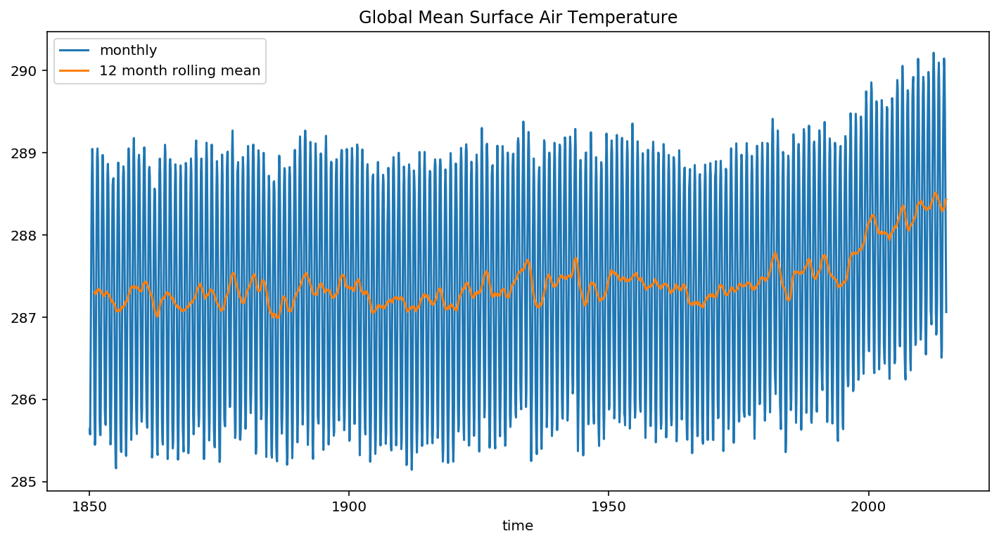

In [0]:
ta_timeseries.plot(label='monthly')
ta_timeseries.rolling(time=12).mean().plot(label='12 month rolling mean')
plt.legend()
plt.title('Global Mean Surface Air Temperature')

In [0]:
ta_timeseries

<xarray.DataArray (time: 1980)>
array([285.6408 , 285.57397, 286.33856, ..., 288.6992 , 287.76303,
       287.0621 ], dtype=float32)
Coordinates:
  * time     (time) object 1850-01-15 12:00:00 ... 2014-12-15 12:00:00

In [0]:
df = ta_timeseries

In [0]:
df.dtype

dtype('float32')

# Streamlined pipeline for CMIP-6

In [0]:
# Load array of availible models that do RCP 8.5 and have an area file (to calc temperature)
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df_mod = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == 'ssp585'")
models = df_mod.source_id.unique()
models = list(models)
df_area = df.query("variable_id == 'areacella'")
areas = df_area.source_id.unique()
areas = list(areas)
models = set(models) & set(areas)
# remove this 'MAC' model because it has bad longitude and latitude values
models = ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']

## Loop though all models and make a big dataframe of all temperatures (global)

In [72]:
allT = pd.DataFrame({'model': [], 'ssp': [], 'year': [], 'mean_tas': []})
years = np.arange(1850,2100,1).astype(int)

df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
for model in models:
    print(model)
    # get area of the grids
    df_area = df.query("variable_id == 'areacella' & source_id == '%s'"%(model))
    ds_area = xr.open_zarr(gcs.get_mapper(df_area.zstore.values[0]), consolidated=True)

    # here we filter the data to find monthly surface air temperature for historical experiments.
    df_ta_h = df.query("activity_id=='CMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == 'historical' & source_id == '%s'"%(model))
    mapper = gcs.get_mapper(df_ta_h.zstore.values[0])
    ds_h = xr.open_zarr(mapper, consolidated=True)

    # calculate global mean
    total_area = ds_area.areacella.sum(dim=['lon', 'lat'])
    ta_timeseries = (ds_h.tas * ds_area.areacella).sum(dim=['lon', 'lat']) / total_area
    # calculate yearly averages and write to numpy array
    ta_hist = ta_timeseries.values
    ta_h = np.zeros(165)
    for i in range(165): ta_h[i] = ta_hist[(i*12):(i*12)+12].mean() 
    
    # loop through all ssps (RCPs) for each availible model
    df_ssp = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & source_id == '%s'"%(model))
    ssps = df_ssp.experiment_id.unique()
    for ssp in ssps:
        df_fut = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '%s' & source_id == '%s'"%(ssp, model))
        mapper = gcs.get_mapper(df_fut.zstore.values[0])
        ds_fut = xr.open_zarr(mapper, consolidated=True)

        # calculate global mean
        ta_timeseries = (ds_fut.tas * ds_area.areacella).sum(dim=['lon', 'lat']) / total_area
        # calculate yearly averages and write to numpy array
        ta_fut = ta_timeseries.values
        ta_f = np.zeros(85)
        for i in range(85): ta_f[i] = ta_fut[(i*12):(i*12)+12].mean() 

        ta = np.concatenate((ta_h, ta_f))
        dftemp = pd.DataFrame({'model': model, 'ssp': ssp, 'year': years, 'mean_tas': ta})
        allT = pd.concat((allT,dftemp))

        

allT.to_csv('/content/drive/Shared drives/GEOS39650/climate_emulator/data/12_CMIP6_models_global_mean.csv', sep=',', index=False)

CESM2
CESM2-WACCM
CNRM-CM6-1


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: Mean of empty slice.
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


CNRM-ESM2-1
CanESM5
GFDL-CM4
GFDL-ESM4
IPSL-CM6A-LR
MIROC-ES2L
MIROC6
MPI-ESM1-2-HR
MRI-ESM2-0


In [0]:
dftemp

,model,ssp,year,mean_tas
0,MRI-ESM2-0,ssp585,1850,286.940216
1,MRI-ESM2-0,ssp585,1851,286.991943
2,MRI-ESM2-0,ssp585,1852,286.911530
3,MRI-ESM2-0,ssp585,1853,286.806549
4,MRI-ESM2-0,ssp585,1854,286.767242
...,...,...,...,...
245,MRI-ESM2-0,ssp585,2095,291.359009
246,MRI-ESM2-0,ssp585,2096,291.552704
247,MRI-ESM2-0,ssp585,2097,291.771454
248,MRI-ESM2-0,ssp585,2098,291.462769


In [0]:
allT['ssp'].value_counts()

ssp585    3000
ssp245    3000
ssp126    2750
ssp370    2750
ssp119    1750
Name: ssp, dtype: int64

In [0]:
allT['model'].value_counts()

MIROC-ES2L       1250
CanESM5          1250
GFDL-ESM4        1250
MRI-ESM2-0       1250
IPSL-CM6A-LR     1250
MIROC6           1250
CNRM-ESM2-1      1250
CESM2            1000
CESM2-WACCM      1000
MPI-ESM1-2-HR    1000
CNRM-CM6-1       1000
GFDL-CM4          500
Name: model, dtype: int64

In [0]:
counter =0
allT_mod = np.zeros(shape=(1250,4))
for model in ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']:
  for rcp in ['ssp245','ssp585','ssp126','ssp370','ssp119']:
    allT_mod = allT[allT.model== model]
    allT_mod = allT_mod[allT_mod.ssp==rcp]


In [0]:
allT_mod

,model,ssp,year,mean_tas
0,MRI-ESM2-0,ssp119,1850.0,286.940216
1,MRI-ESM2-0,ssp119,1851.0,286.991943
2,MRI-ESM2-0,ssp119,1852.0,286.911530
3,MRI-ESM2-0,ssp119,1853.0,286.806549
4,MRI-ESM2-0,ssp119,1854.0,286.767242
...,...,...,...,...
245,MRI-ESM2-0,ssp119,2095.0,288.159180
246,MRI-ESM2-0,ssp119,2096.0,288.181885
247,MRI-ESM2-0,ssp119,2097.0,288.063446
248,MRI-ESM2-0,ssp119,2098.0,287.970795


# Regression

In [0]:
# load temperature data
df = pd.read_csv('/content/drive/Shared drives/GEOS39650/climate_emulator/data/12_CMIP6_models_global_mean.csv', sep=',')
df1 = df[df.model == 'MRI-ESM2-0'] #filter for a model
df1 = df1[df1.ssp == 'ssp585']     #filter an RCP
df1.mean_tas

13000    286.940216
13001    286.991943
13002    286.911530
13003    286.806549
13004    286.767242
            ...    
13245    291.359009
13246    291.552704
13247    291.771454
13248    291.462769
13249    291.568451
Name: mean_tas, Length: 250, dtype: float64

In [0]:
df1.columns

Index(['model', 'ssp', 'year', 'mean_tas'], dtype='object')

# check co2 numbers (these numbers are wrong... we want GHG eqivalent values... table needs to be changed)

In [0]:
co2 = np.array([[287.78, 289.916, 291.898, 295.77, 300.064, 302.579, 308.156, 313.601, 320.124, 325.322, 327.921, 337.17, 351.328, 371.945, 395.324, 415.858, 442.38, 469.324, 494.974, 524.967, 562.025, 606.679, 658.827, 715.961, 764.288, 799.868],
                [287.780, 289.916, 291.898, 295.770, 300.064, 302.579, 308.156, 313.601, 320.124, 325.322, 327.921, 337.170, 351.328, 371.945, 395.324, 415.858, 442.353, 471.958, 503.799, 537.235, 569.715, 596.993, 614.770, 621.480, 623.855, 629.592],
                [287.780, 289.916, 291.898, 295.770, 300.064, 302.579, 308.156, 313.601, 320.124, 325.322, 327.921, 337.170, 351.328, 371.945, 395.324, 415.858, 442.761, 470.821, 490.699, 501.433, 503.321, 499.944, 494.224, 487.717, 481.394, 475.193],
                [287.780, 289.916, 291.898, 295.770, 300.064, 302.579, 308.156, 313.601, 320.124, 325.322, 327.921, 337.170, 351.328, 371.945, 395.324, 415.858, 443.065, 482.759, 534.353, 599.343, 683.062, 785.604, 902.529, 1029.936, 1167.748, 1313.451]]).transpose()


In [0]:
x = np.array(pd.DataFrame(co2, columns=['RCP60', 'RCP45', 'RCP26', 'RCP85'], index=np.linspace(1850, 2100, 26)).reindex(np.linspace(1850, 2100, 251)).interpolate(method='cubic'))

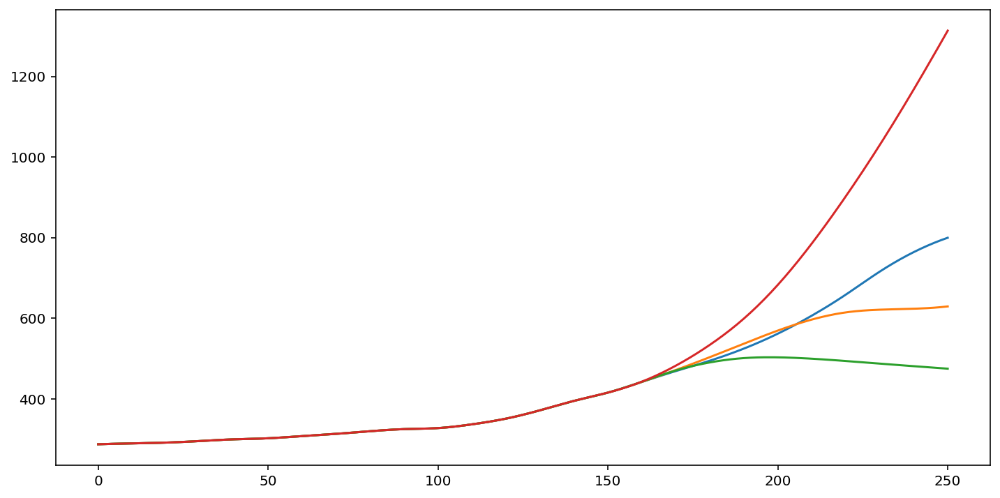

In [0]:
plt.plot(x)

In [0]:
#from sklearn.preprocessing import Imputer
y=list(x)

In [0]:
x.shape

(251, 4)

In [0]:
for col in range(1):
  for num, val in enumerate(x):
    print(x[num][col])

287.78
288.0788580488544
288.35144092438634
288.6004969791873
288.82877456584856
289.03902203696146
289.2339877451175
289.4164200429079
289.5890672829243
289.7546778177578
289.916
290.07578218224216
290.23677271707584
290.4017199570921
290.57337225488254
290.7544779630386
290.9477854341515
291.1560430208127
291.3819990756137
291.62840195114563
291.898
292.19283722217693
292.51214020731067
292.8544311924445
293.21823241462135
293.60206611088444
294.00445451827676
294.4239198738414
294.8589844146214
295.3081703776599
295.77
296.2423009290503
296.7201224536816
297.1978192731302
297.6697460866322
298.130257593424
298.57370849274196
298.9944534838222
299.38684726590105
299.74524453821493
300.064
300.34021806162184
300.58200197796293
300.8002047150352
301.00567923885023
301.20927851541984
301.42185551075596
301.65426319087027
301.9173545217744
302.22198246948045
302.579
302.99599782446234
303.46751763446656
303.98483886672943
304.53924095796725
305.1220033448967
305.7244054642346
306.3377267

In [0]:
xnew = np.zeros_like(x)
rho = 0.8
for j in range(x.shape[1]):
  for i in range(x.shape[0]):
    ks = np.flip(np.arange(0,i))
    rhoa = rho ** ks 
    #print(rhoa.sum())
    xnew[i,j] = (1- rho) * np.sum(rhoa*(np.log((x[0:i,j])/287.780)))

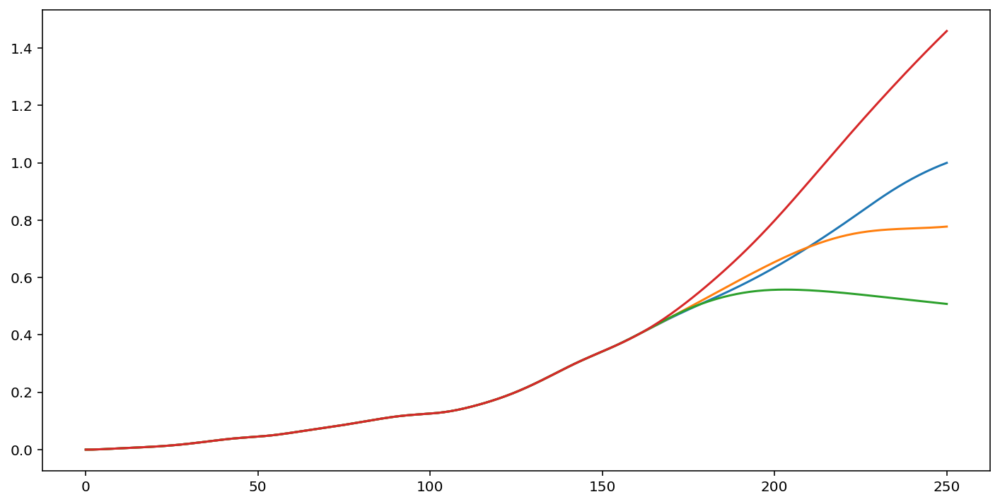

In [0]:
plt.plot(xnew)

In [0]:
xnew

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.07591198e-04, 2.07591199e-04, 2.07591198e-04, 2.07591200e-04],
       ...,
       [9.90441430e-01, 7.75905240e-01, 5.10623737e-01, 1.43602300e+00],
       [9.95279537e-01, 7.76735606e-01, 5.09327481e-01, 1.44790180e+00],
       [9.99929918e-01, 7.77666003e-01, 5.08029214e-01, 1.45969412e+00]])

# check log sumation function to calculate past CO2 trajectory


In [0]:
rho = 0.8
x_co2 = np.zeros(shape=(251,4))


for col in range(4):
  counter=0
  while(counter<250):
    for num, val in enumerate(x):
      series = 0
      result = 0
      while(num >=0):
        result += (np.power(rho,num))*(np.log(x[series][col]/287.78))
        series = series +1
        num = num - 1
      result=0.2*result
      x_co2[series-1][col]= result
      counter = counter + 1
    

In [0]:
x_co2

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.07591198e-04, 2.07591199e-04, 2.07591198e-04, 2.07591200e-04],
       [5.62816529e-04, 5.62816530e-04, 5.62816529e-04, 5.62816534e-04],
       ...,
       [9.95279537e-01, 7.76735606e-01, 5.09327481e-01, 1.44790180e+00],
       [9.99929918e-01, 7.77666003e-01, 5.08029214e-01, 1.45969412e+00],
       [1.00439402e+00, 7.78707941e-01, 5.06728319e-01, 1.47139870e+00]])

# reshape x and y so that they  are vertical 

np.reshape (250,1)

In [0]:
#m = LinearRegression( normalize = False, fit_intercept = True )
#m.fit(x,Y).coef_

In [0]:
xnew = np.array(pd.DataFrame(xnew, columns=['RCP60', 'RCP45', 'RCP24', 'RCP85']))

In [0]:
xnew

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.07591198e-04, 2.07591199e-04, 2.07591198e-04, 2.07591200e-04],
       ...,
       [9.90441430e-01, 7.75905240e-01, 5.10623737e-01, 1.43602300e+00],
       [9.95279537e-01, 7.76735606e-01, 5.09327481e-01, 1.44790180e+00],
       [9.99929918e-01, 7.77666003e-01, 5.08029214e-01, 1.45969412e+00]])

In [0]:
xnew=np.delete(xnew,0,1)

Test set RMSE of dt: 0.25


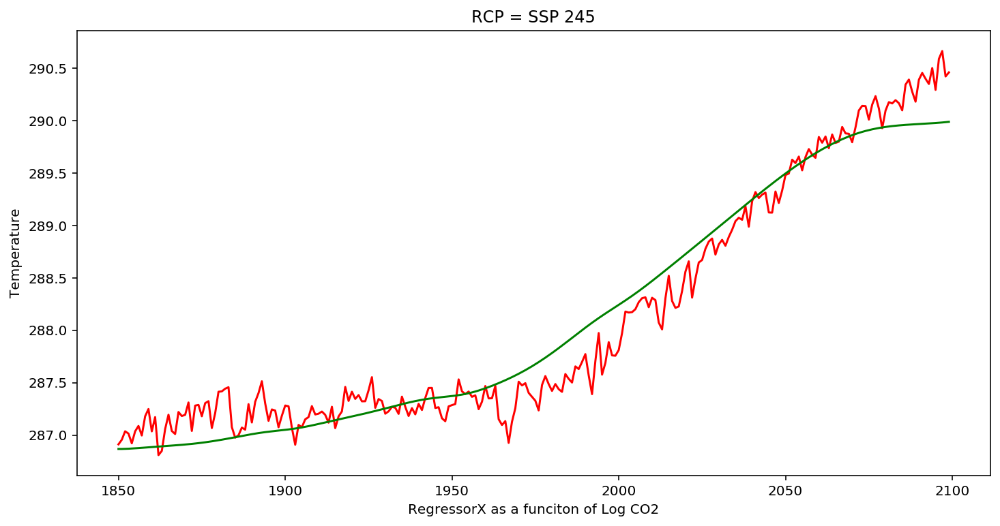

Test set RMSE of dt: 0.26


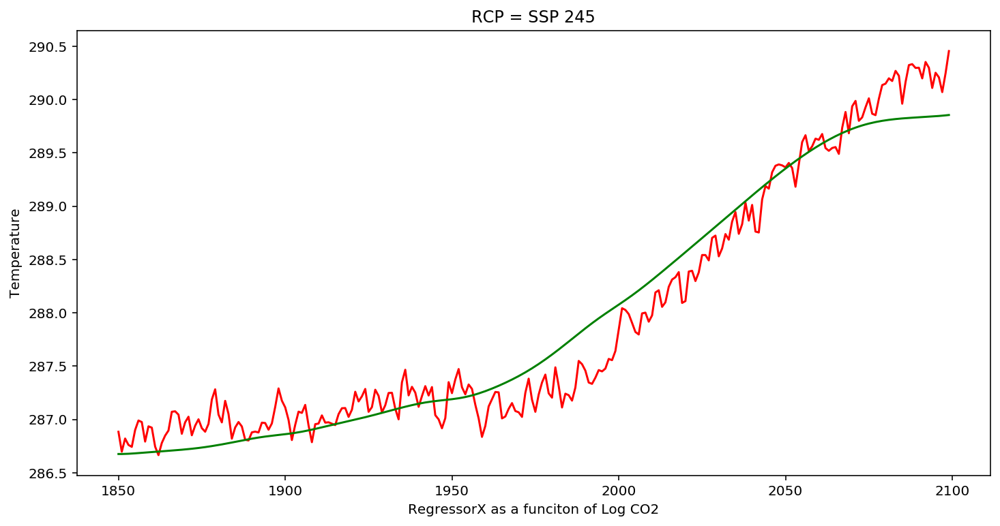

Test set RMSE of dt: 0.28


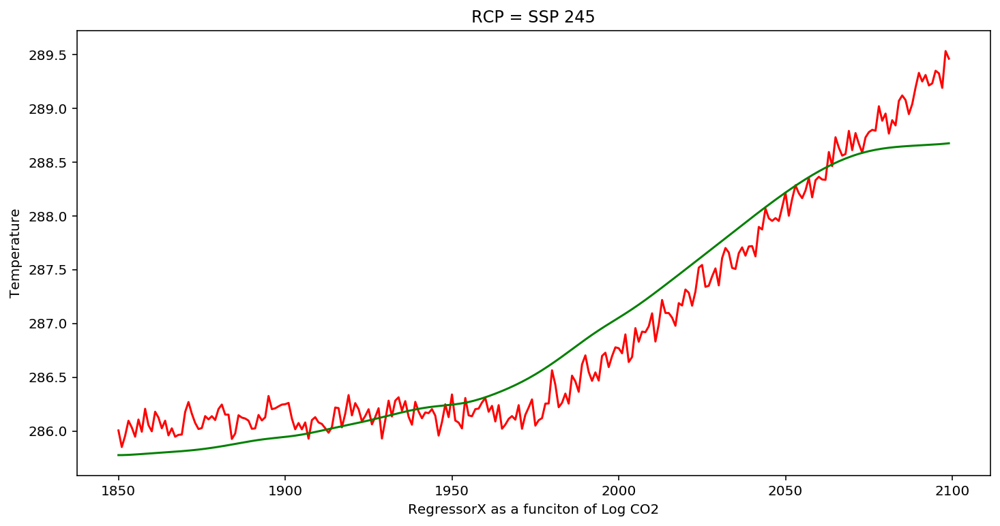

Test set RMSE of dt: 0.27


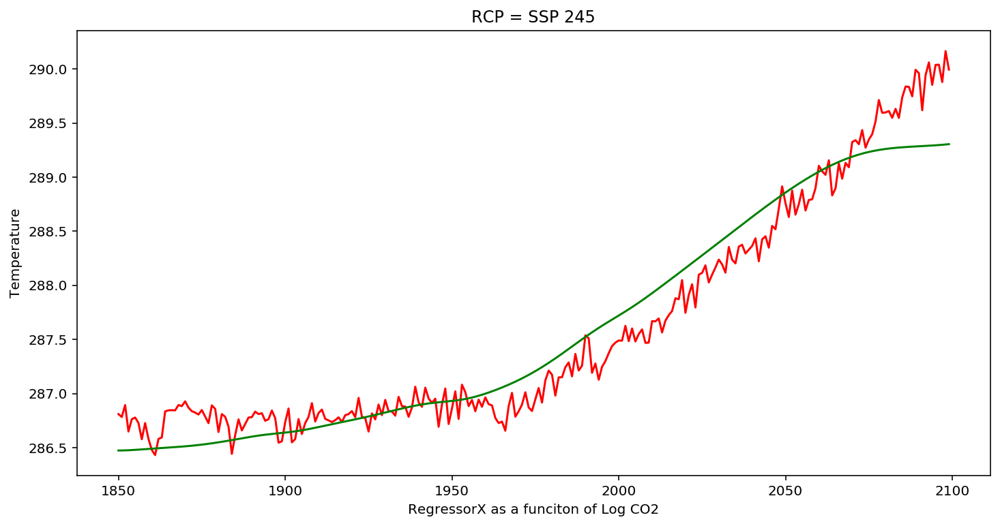

Test set RMSE of dt: 0.31


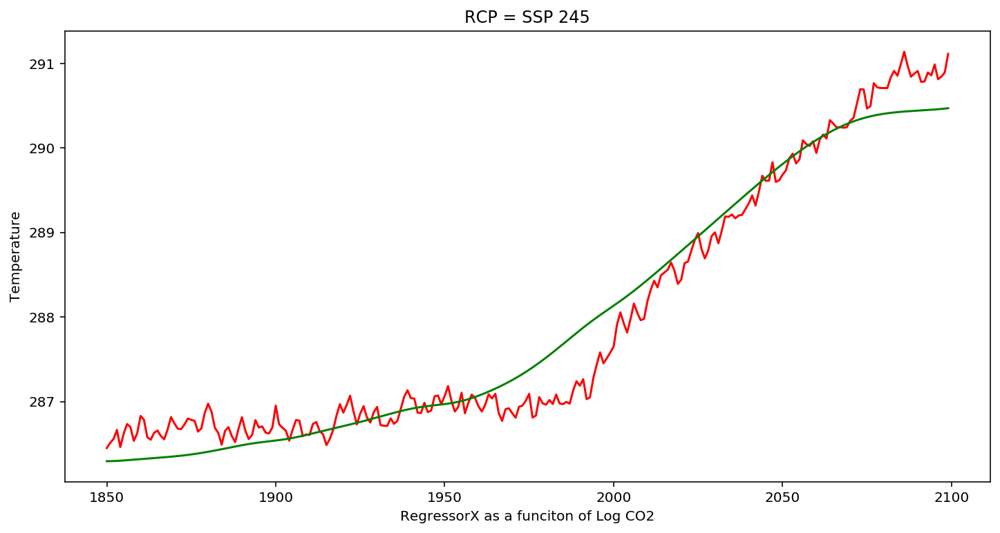

Test set RMSE of dt: 0.21


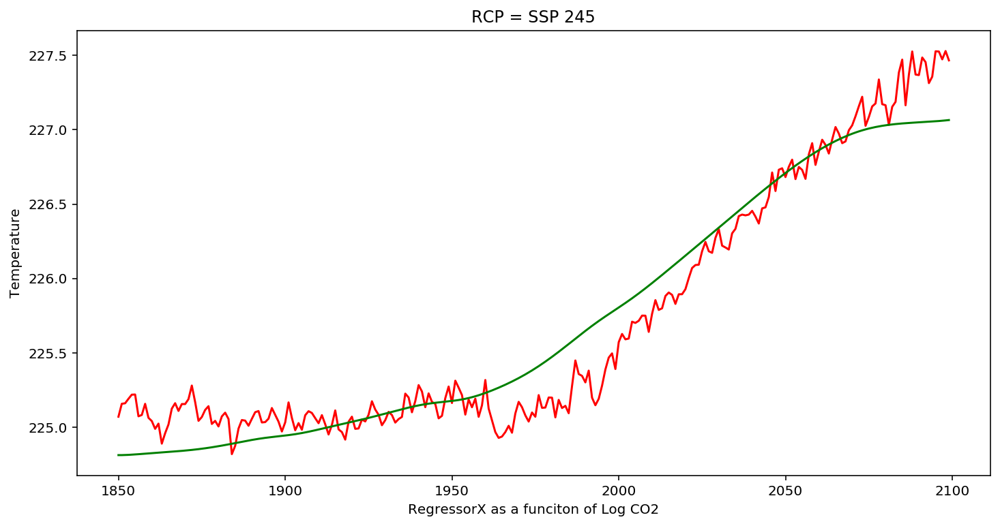

Test set RMSE of dt: 0.15


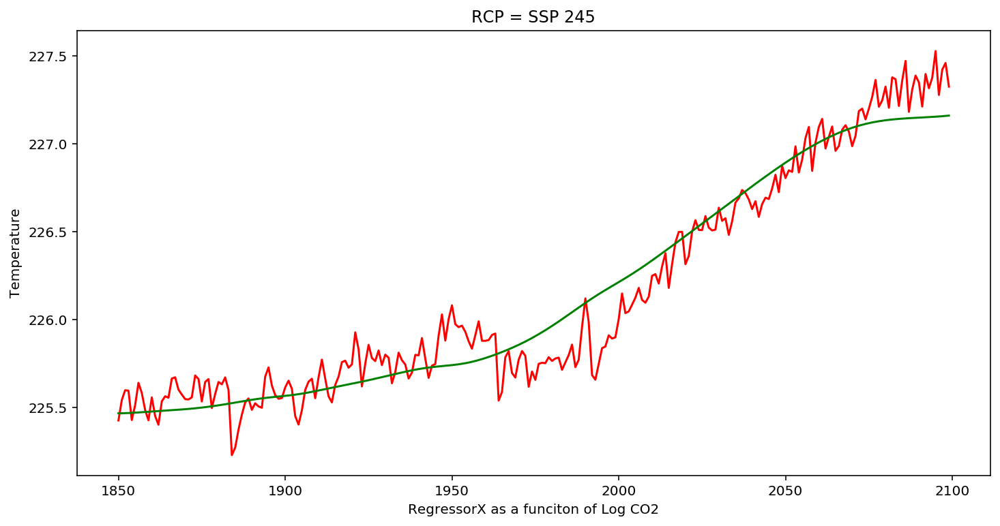

Test set RMSE of dt: 0.27


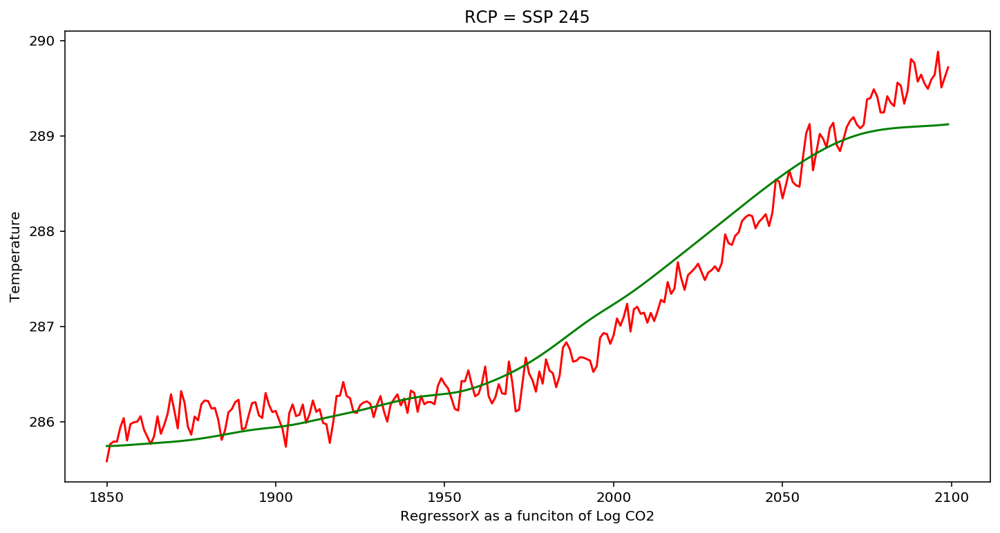

Test set RMSE of dt: 0.25


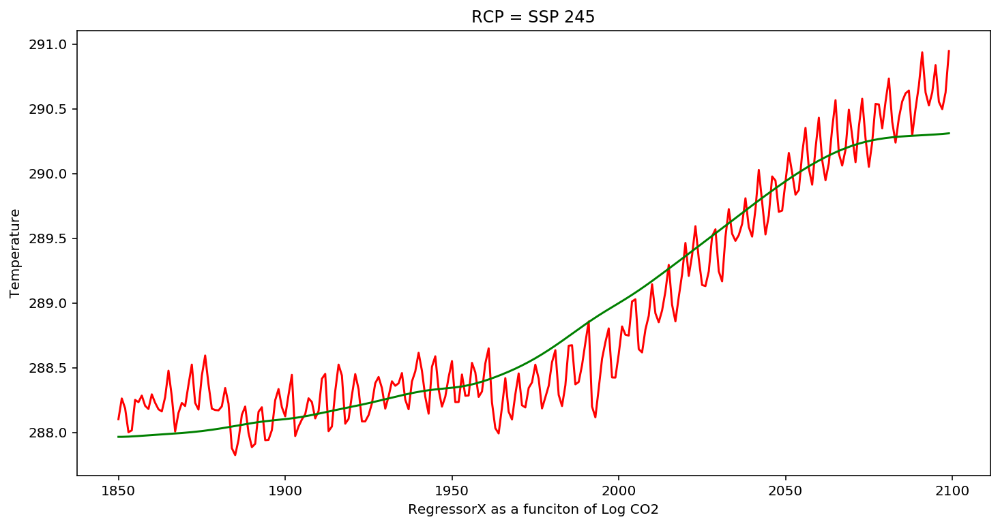

Test set RMSE of dt: 0.22


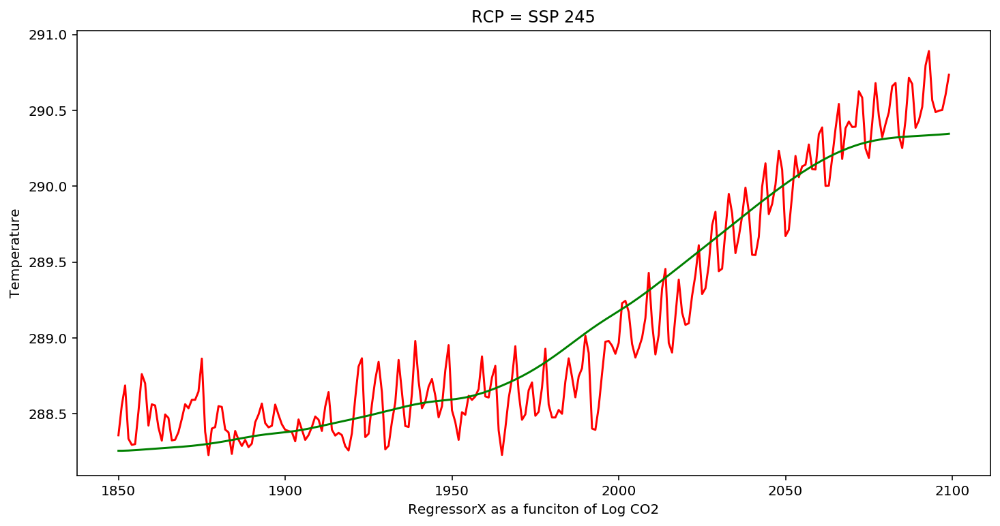

Test set RMSE of dt: 0.07


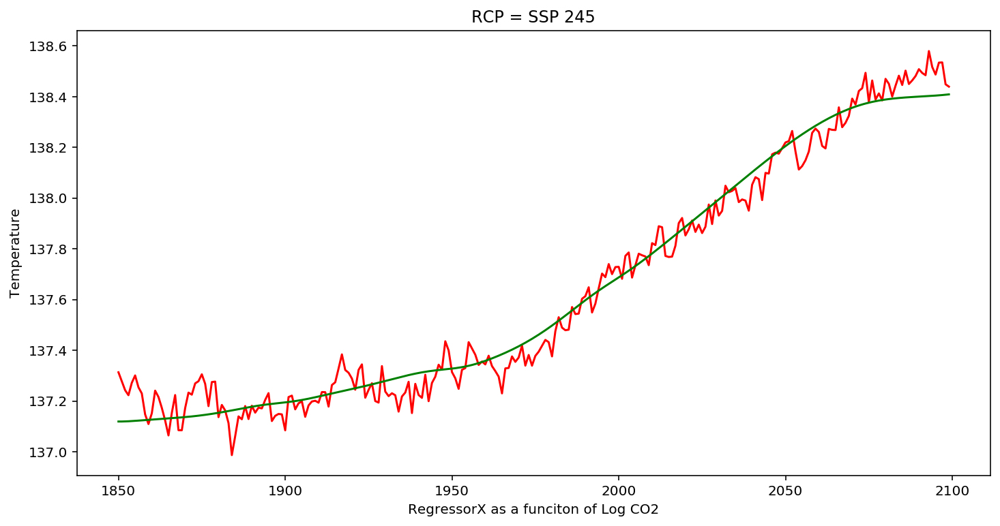

Test set RMSE of dt: 0.22


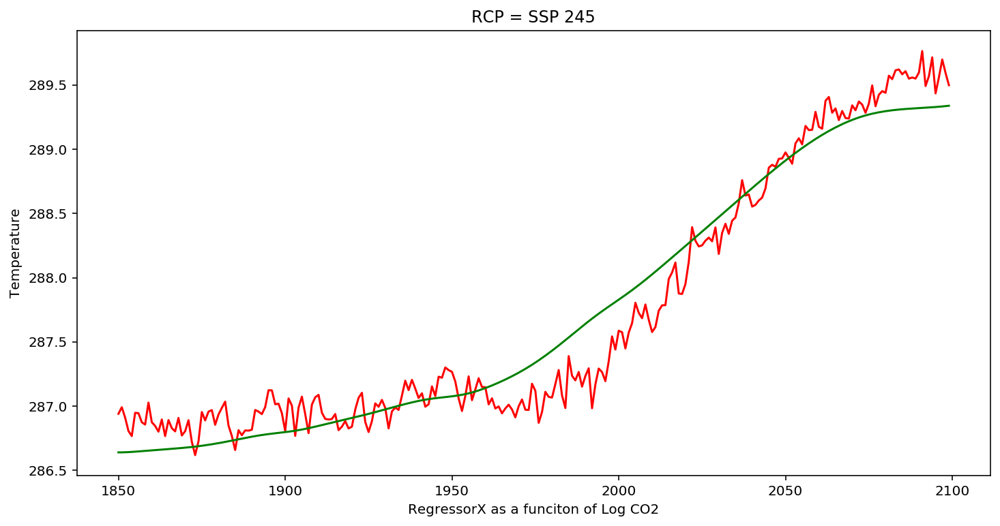

In [0]:

# REGRESSIONS FOR VARIOUS MODELS ON SSP 245 PATHWAY
from matplotlib import pyplot
from sklearn.metrics import mean_squared_error
from math import sqrt
beta1=[]
beta0 = []
fit_mod = []
ser_no = 0
res = []
allT_mod = np.zeros(shape=(1250,4))
for model in ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']:
  for rcp in ['ssp245']:
    allT_mod = allT[allT.model== model]
    allT_mod = allT_mod[allT_mod.ssp==rcp]
    x_r = xnew[0:250,0]
    x_r = pd.DataFrame(x_r)
    y = allT_mod["mean_tas"]
    m = LinearRegression(normalize = False, fit_intercept = True )
    fitted = m.fit(x_r,y)
    fit_mod.append(fitted)
    beta1.append(fitted.coef_)
    beta0.append(fitted.intercept_)

    y_predict= fit_mod[ser_no].predict(x_r)
    error = y_predict - y
    res.append(error)
    
    # Compute mse_dt
    mse_dt = mean_squared_error(y, y_predict)
    # Compute rmse_dt
    rmse_dt = mse_dt**(1/2)

    year = range(1850,2100,1)

    print("Test set RMSE of dt: {:.2f}".format(rmse_dt))
    plt.plot(year, y, color = "red")
    plt.plot(year, y_predict, color = "green")
    plt.title("RCP = SSP 245")
    plt.xlabel("RegressorX as a funciton of Log CO2")
    plt.ylabel("Temperature")
    plt.show()
    ser_no +=1


  

In [0]:
beta1

[array([4.02052345]),
 array([4.09303782]),
 array([3.73225941]),
 array([3.64513089]),
 array([5.37565233]),
 array([2.897338]),
 array([2.18179028]),
 array([4.34725341]),
 array([3.01802821]),
 array([2.69153149]),
 array([1.66071484]),
 array([3.47363893])]

In [0]:
beta0

[286.86790797469865,
 286.6767413146161,
 285.77652090807874,
 286.47360665410014,
 286.2950650802472,
 224.8140044068367,
 225.46652866801367,
 285.74367184485635,
 287.96591235507725,
 288.25582808068174,
 137.1190742887782,
 286.64032624392723]

PREDICTION MODELS

In [0]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

Test set RMSE of dt: 0.92


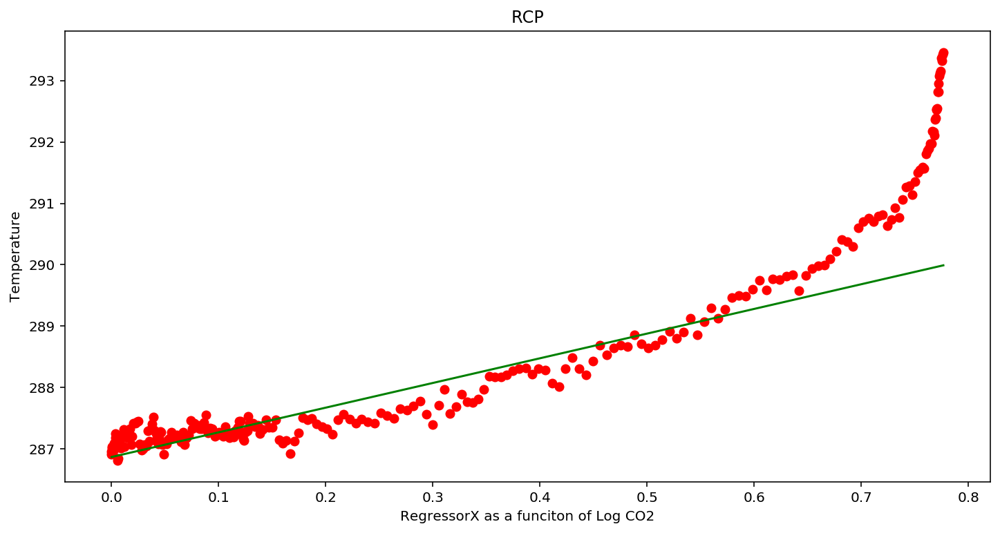

Test set RMSE of dt: 0.92


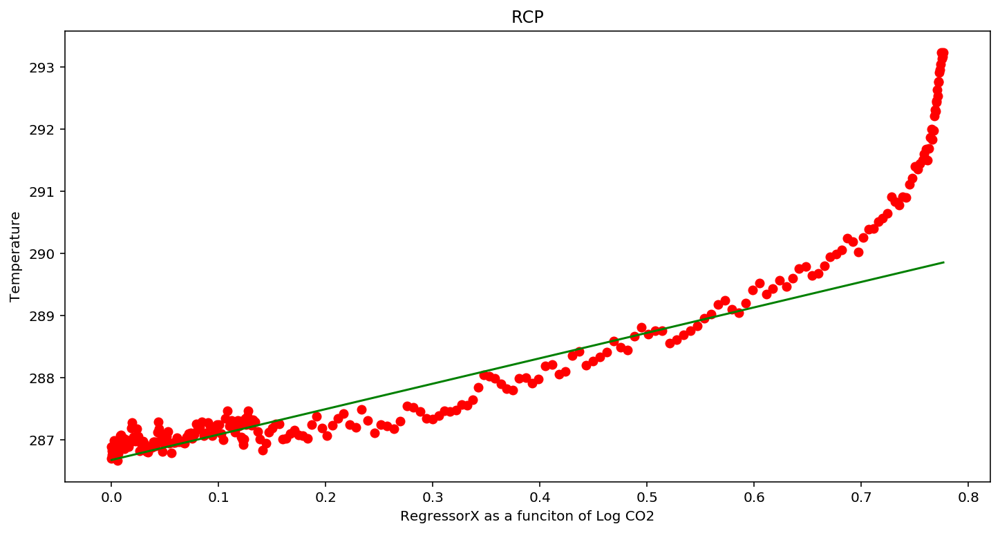

Test set RMSE of dt: 0.94


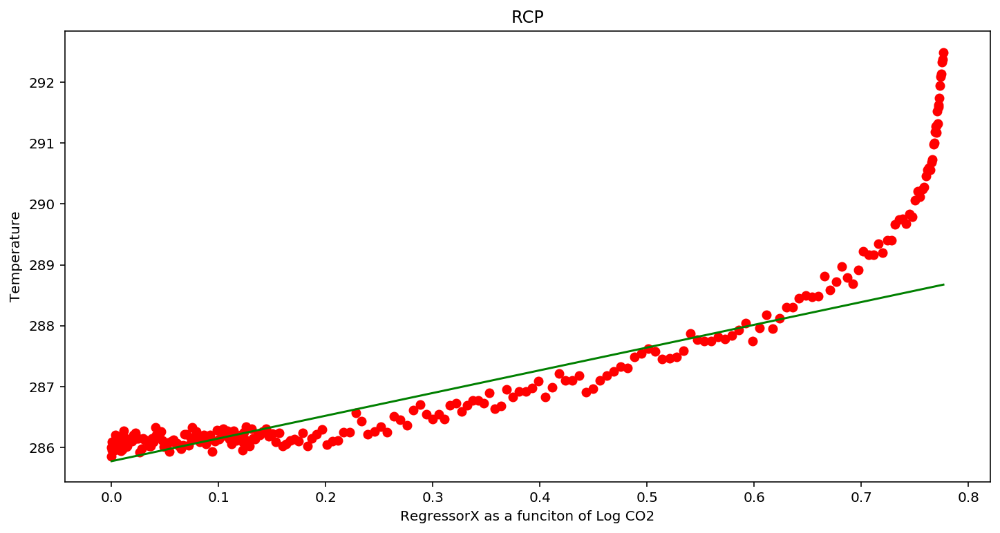

Test set RMSE of dt: 0.79


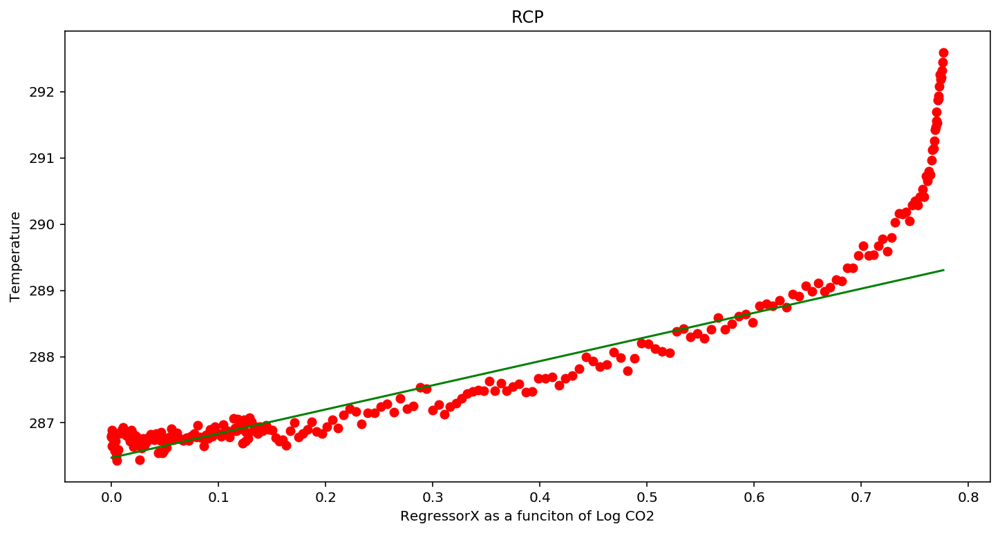

Test set RMSE of dt: 1.09


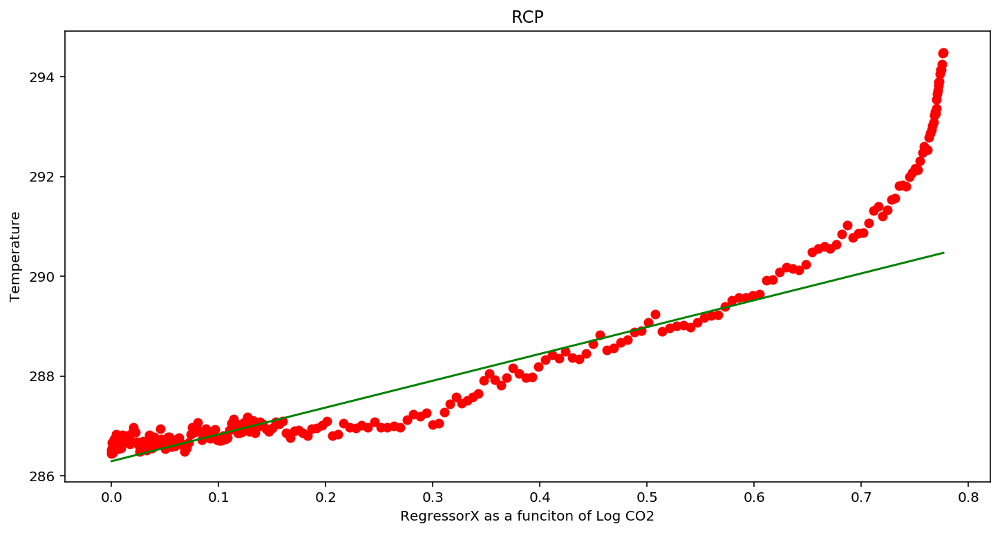

Test set RMSE of dt: 0.59


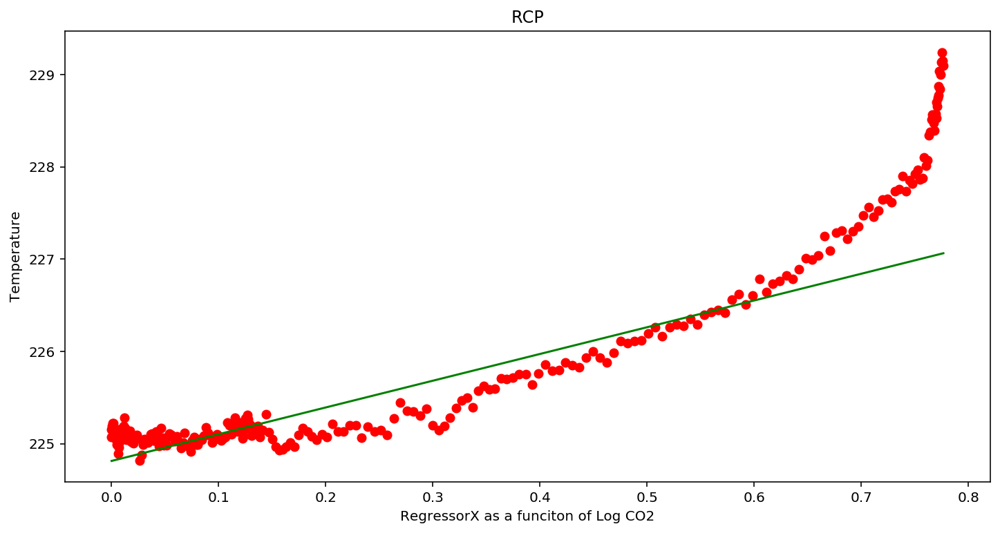

Test set RMSE of dt: 0.45


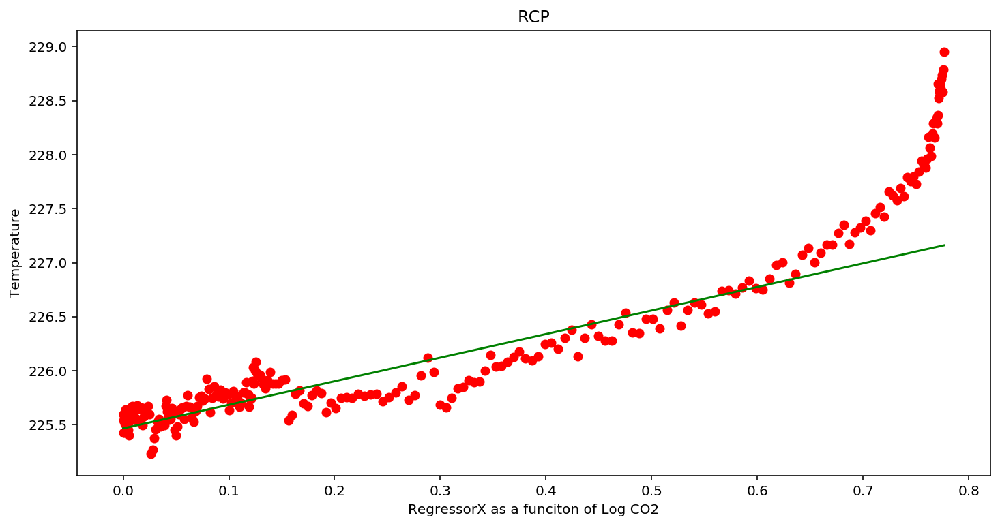

Test set RMSE of dt: 0.94


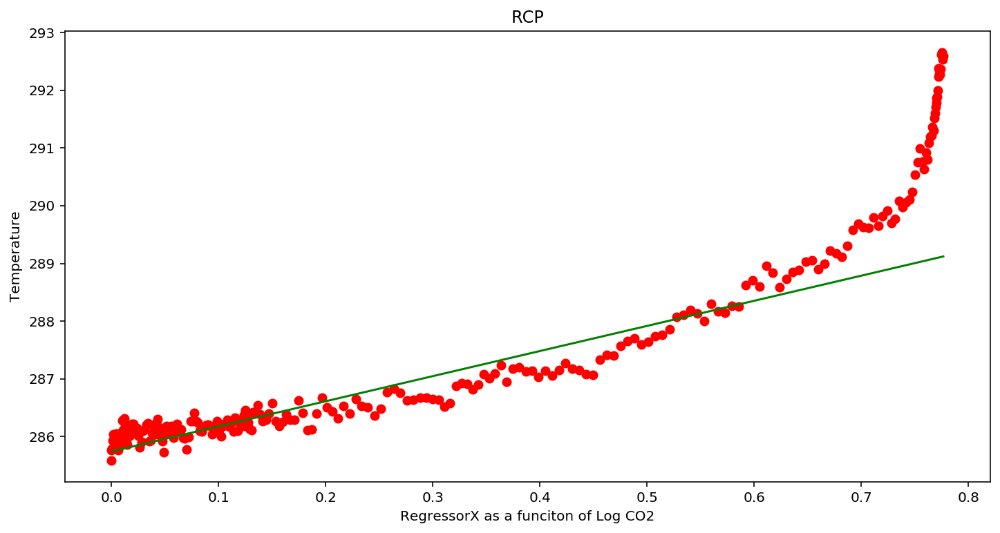

Test set RMSE of dt: 0.65


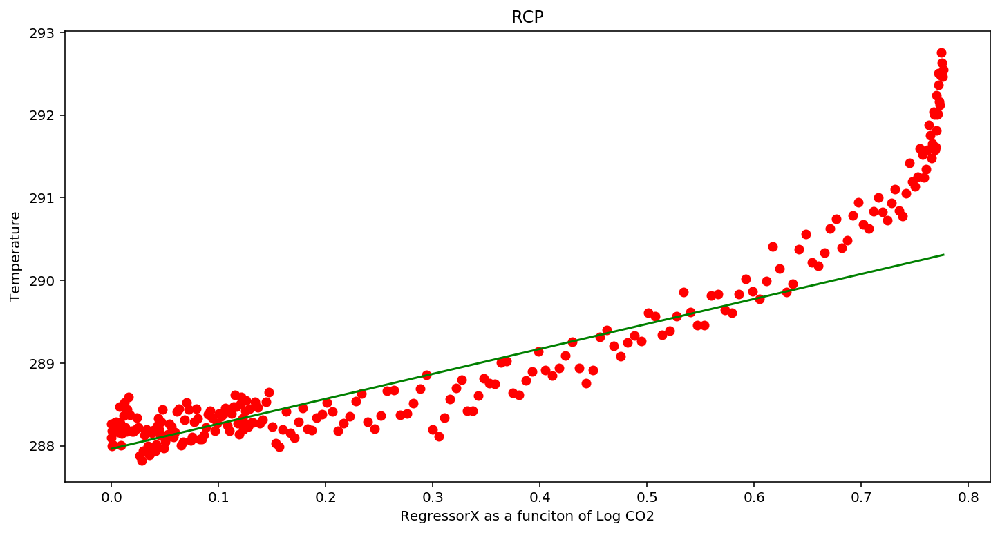

Test set RMSE of dt: 0.62


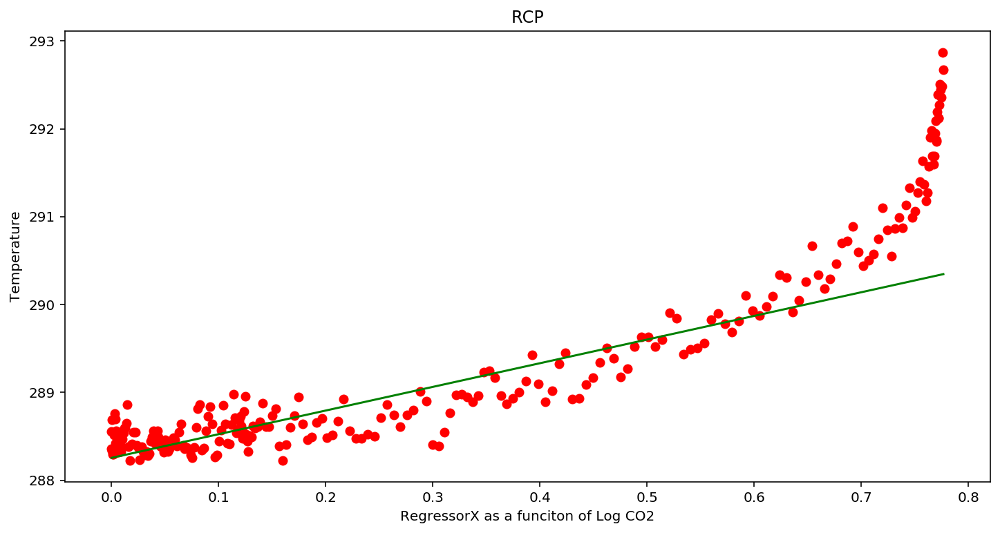

Test set RMSE of dt: 0.28


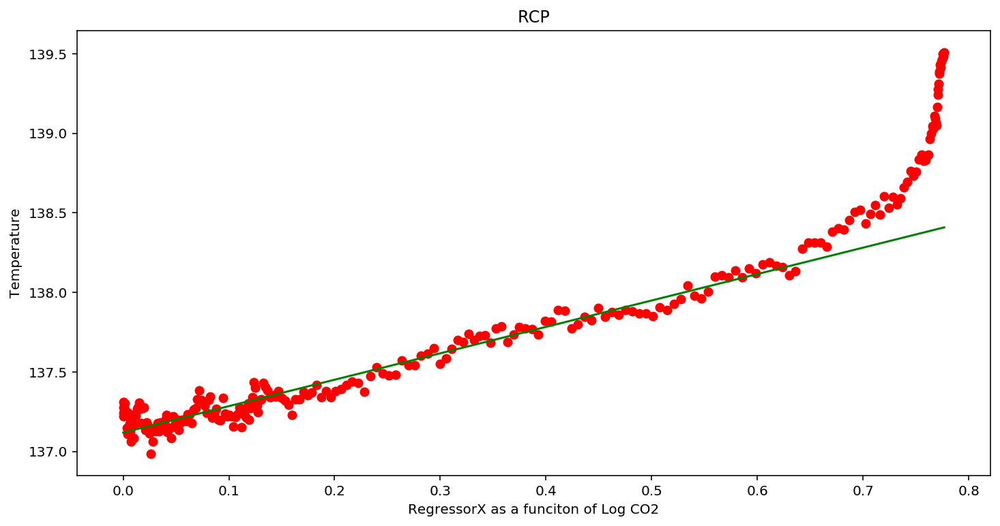

Test set RMSE of dt: 0.65


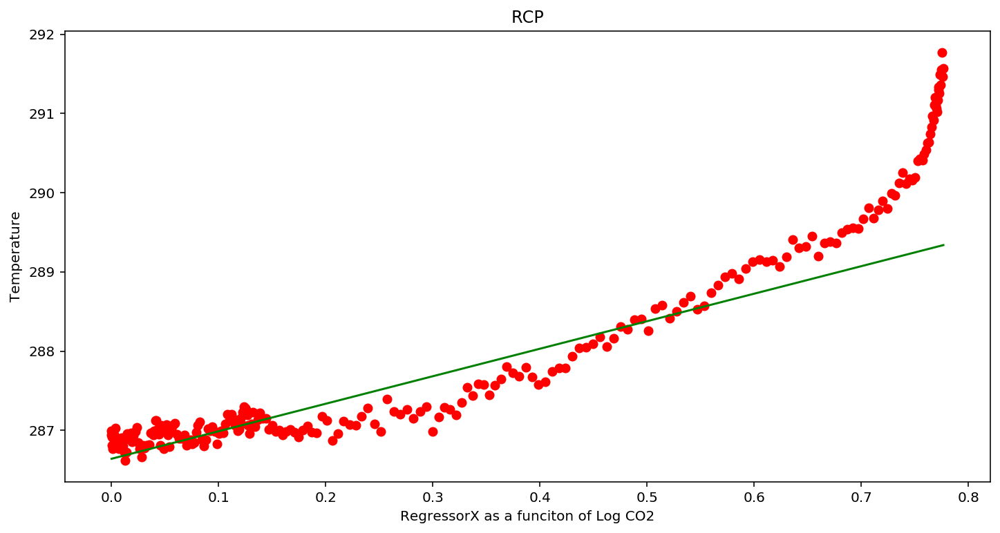

In [0]:
# PREDICTION FOR VARIOUS MODELS ON SSP585 PATHWAY
from sklearn.metrics import mean_squared_error as MSE
import matplotlib.pyplot as plt
beta1=[]
beta0 = []
ser_no = 0
allT_mod = np.zeros(shape=(1250,4))
for model in ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']:
  for rcp in ['ssp585']:
    allT_mod = allT[allT.model== model]
    allT_mod = allT_mod[allT_mod.ssp==rcp]
    x_test = xnew[0:250,2]
    x_test = pd.DataFrame(x_r)
    y_test = allT_mod["mean_tas"]
    y_predict= fit_mod[ser_no].predict(x_test)
    # Compute mse_dt
    mse_dt = MSE(y_test, y_predict)
    # Compute rmse_dt
    rmse_dt = mse_dt**(1/2)
    # Print rmse_dt
    print("Test set RMSE of dt: {:.2f}".format(rmse_dt))
    plt.scatter(x_test, y_test, color = "red")
    plt.plot(x_test, y_predict, color = "green")
    plt.title("RCP")
    plt.xlabel("RegressorX as a funciton of Log CO2")
    plt.ylabel("Temperature")
    plt.show()
    ser_no +=1  

Test set RMSE of dt: 0.31
Test set RMSE of dt: 0.28
Test set RMSE of dt: 0.30
Test set RMSE of dt: 0.33
Test set RMSE of dt: 0.46


ValueError: ignored

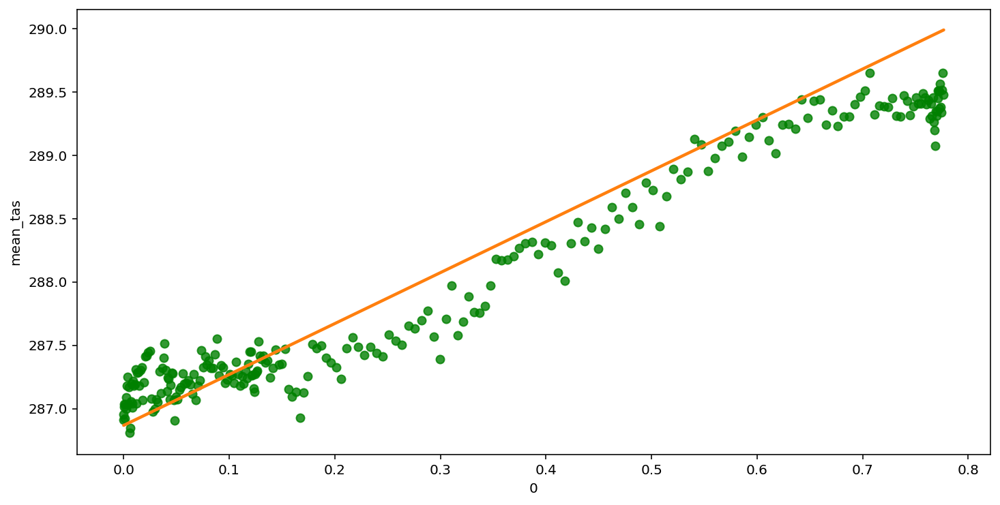

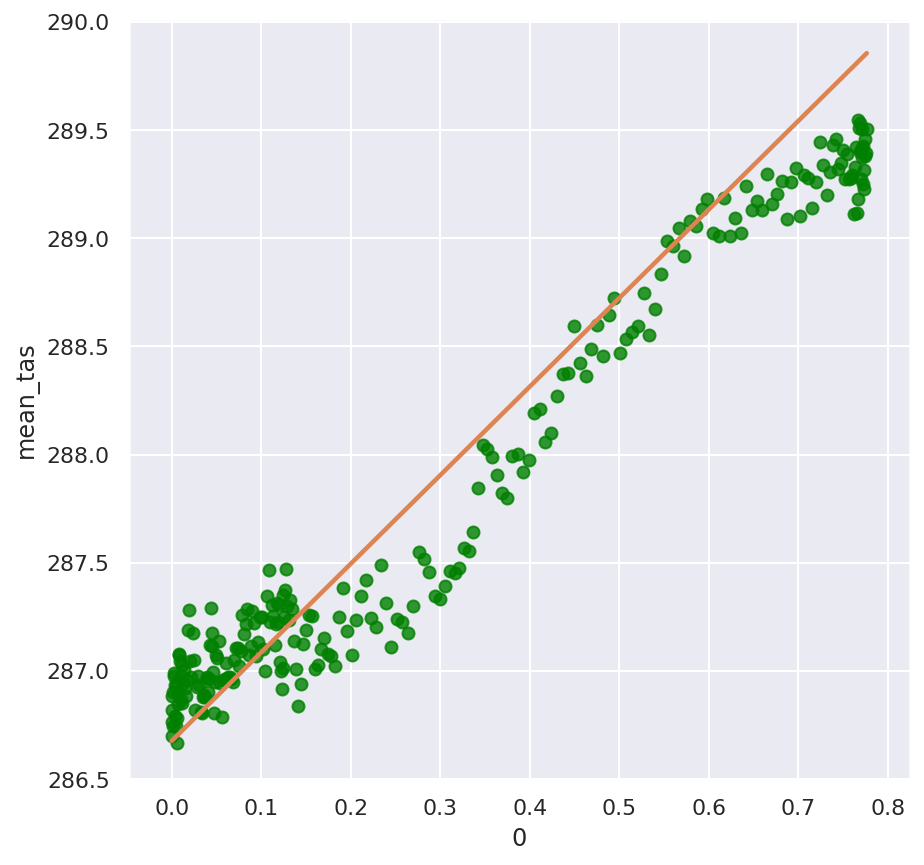

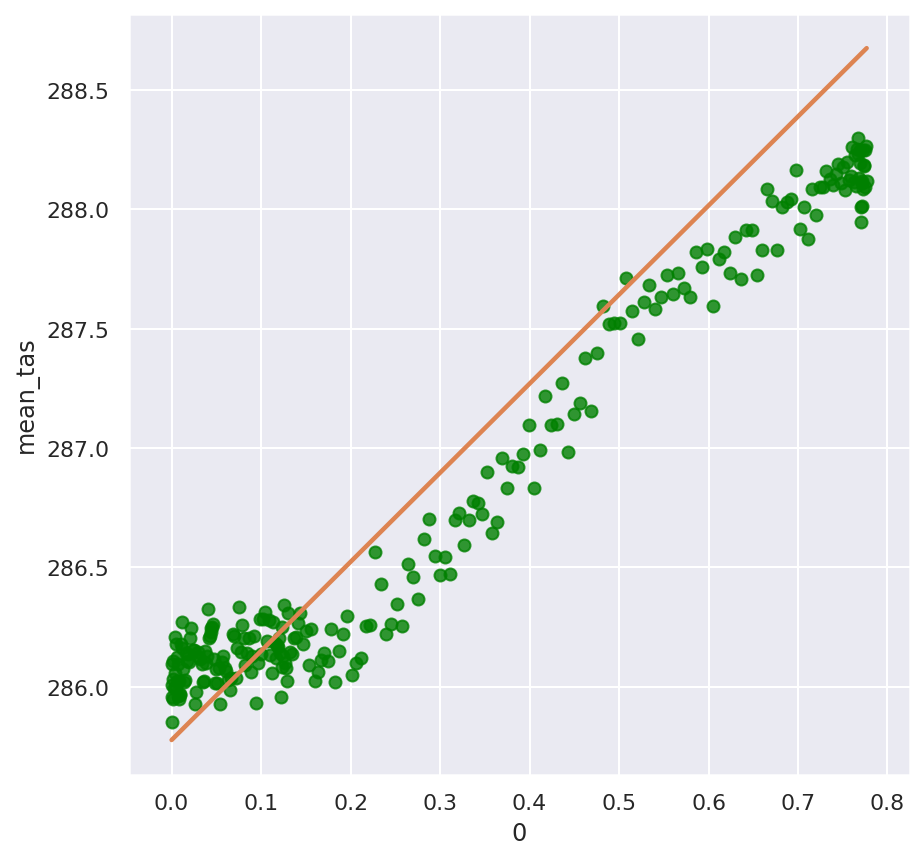

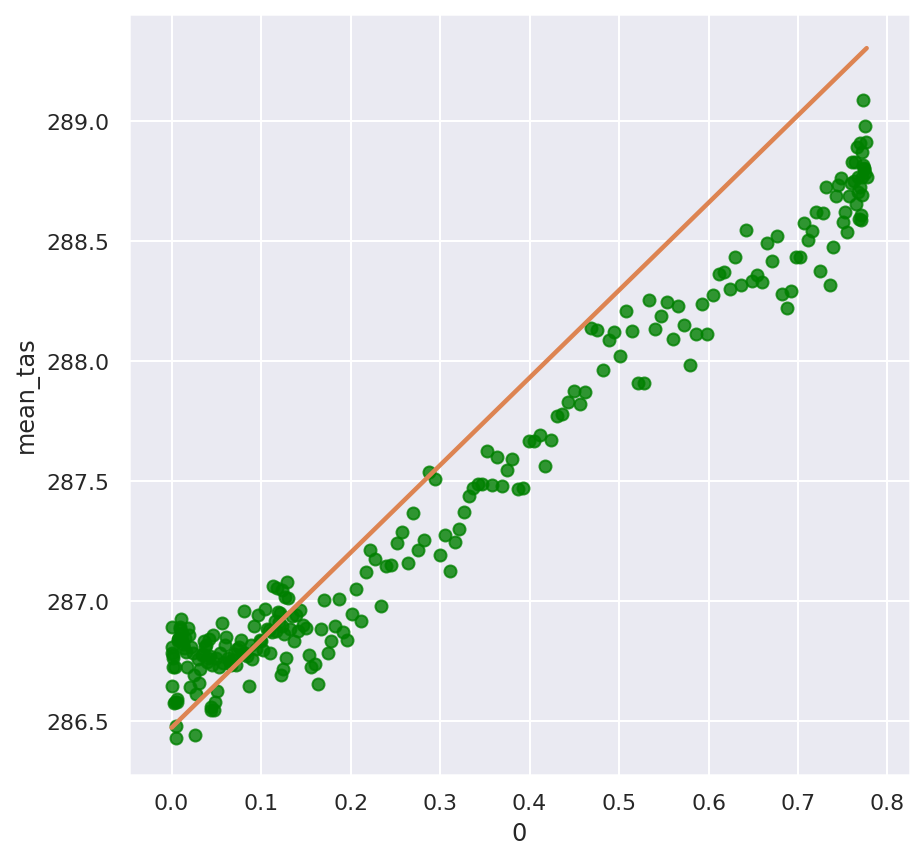

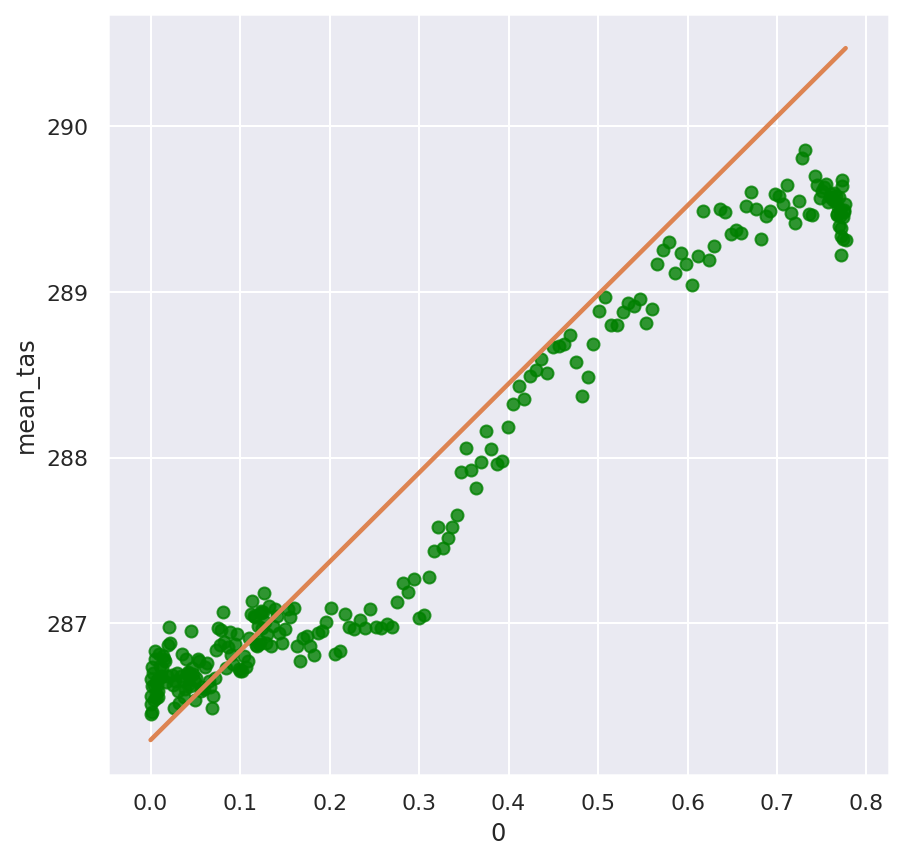

In [0]:
#PREDICTION FOR VARIOUS MODEL ON SSP 126 PATHWAY
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error as MSE
beta1=[]
beta0 = []
ser_no = 0
allT_mod = np.zeros(shape=(1250,4))
for model in ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']:
  for rcp in ['ssp126']:
    allT_mod = allT[allT.model== model]
    allT_mod = allT_mod[allT_mod.ssp==rcp]
    x_test = xnew[0:250,1]
    x_test = pd.DataFrame(x_r)
    y_test = allT_mod["mean_tas"]
    y_predict= fit_mod[ser_no].predict(x_test)
    
    # Compute mse_dt
    mse_dt = MSE(y_test, y_predict)
    # Compute rmse_dt
    rmse_dt = mse_dt**(1/2)
    # Print rmse_dt
    print("Test set RMSE of dt: {:.2f}".format(rmse_dt))
    fig, ax = plt.subplots()
    sns.set(color_codes=True)
    sns.set(rc={'figure.figsize':(7, 7)})
    sns.regplot(x=x_test, y=y_test, fit_reg=False, ax=ax,scatter_kws={"color": "green"});
    sns.regplot(x=x_test, y=y_predict,scatter=False, ax=ax, scatter_kws={"color": "green"});
    ser_no +=1 

## Modelling Time Series
1. Time seris of Temperature
2. Time series of Error Term

In [0]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [0]:
# Temperature Dataframe
dftemp

,model,ssp,year,mean_tas
0,MRI-ESM2-0,ssp585,1850,286.940216
1,MRI-ESM2-0,ssp585,1851,286.991943
2,MRI-ESM2-0,ssp585,1852,286.911530
3,MRI-ESM2-0,ssp585,1853,286.806549
4,MRI-ESM2-0,ssp585,1854,286.767242
...,...,...,...,...
245,MRI-ESM2-0,ssp585,2095,291.359009
246,MRI-ESM2-0,ssp585,2096,291.552704
247,MRI-ESM2-0,ssp585,2097,291.771454
248,MRI-ESM2-0,ssp585,2098,291.462769


In [0]:
#susbetting temperature for mri-esm2
dftemp_mri = dftemp[["year","mean_tas"]]




In [0]:
dftemp_mri.set_index("year",inplace=True, drop=True)
dftemp_mri.head()


,mean_tas
year,
1850,286.940216
1851,286.991943
1852,286.911530
1853,286.806549
1854,286.767242


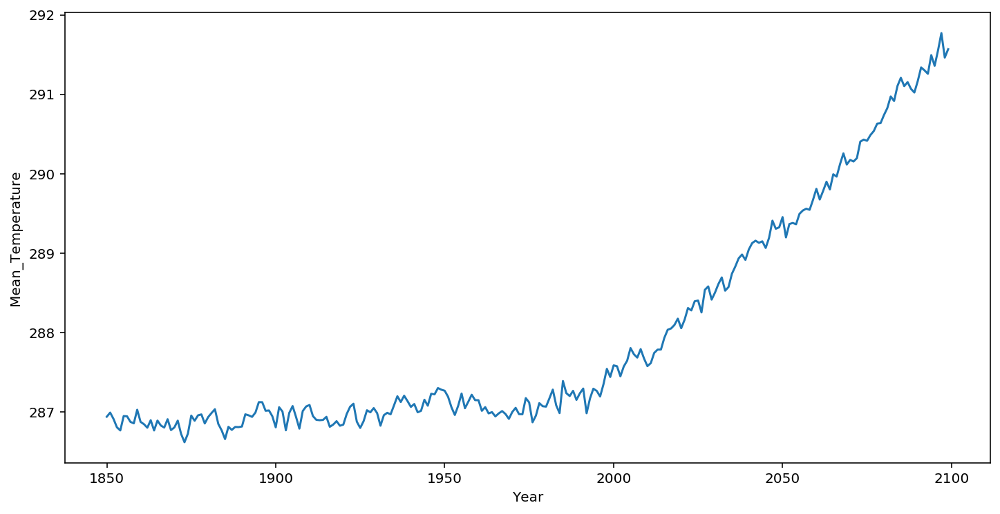

In [0]:
# plotting the temperature
plt.xlabel('Year')
plt.ylabel('Mean_Temperature')
plt.plot(dftemp_mri)

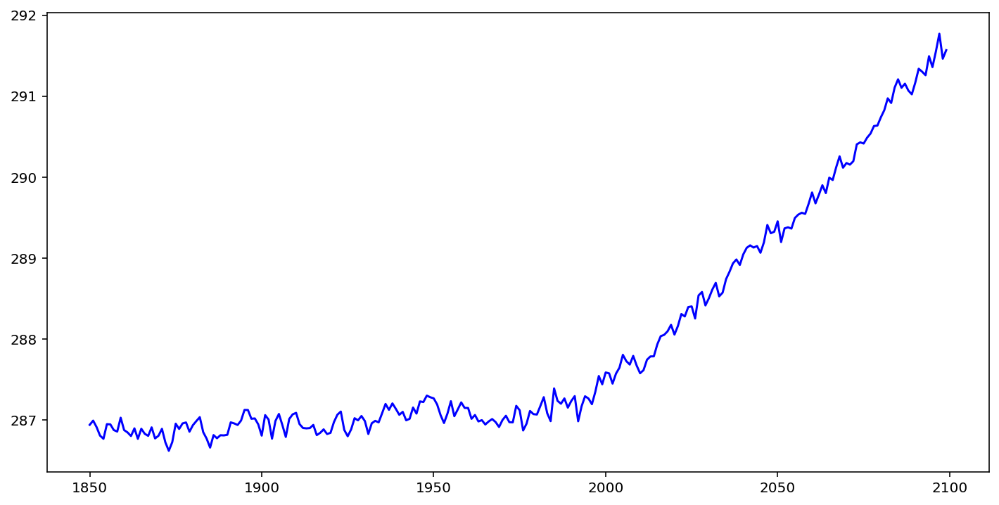

In [0]:
# plot temperature original
plt.plot(dftemp_mri, color = 'blue', label = 'Original')

In [0]:
# rolling mean- window=12
rolling_mean = dftemp_mri.rolling(window = 12).mean()
rolling_std = dftemp_mri.rolling(window = 12).std()


Text(0.5, 1.0, 'Rolling Standard Deviation')

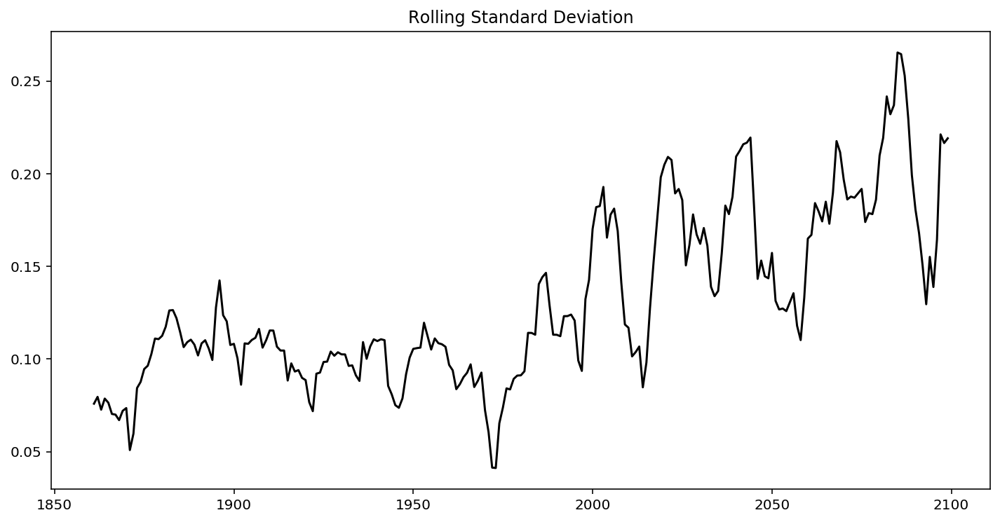

In [0]:
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.title('Rolling Standard Deviation')

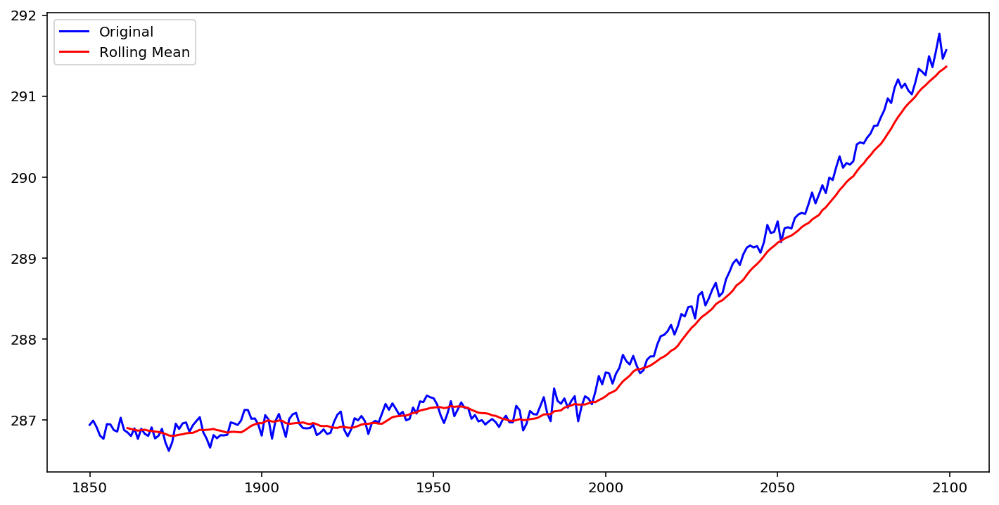

In [0]:
# superimpose rolling mean and original plot- the mena is not stationary
plt.plot(dftemp_mri, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
#plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
#plt.title('Rolling Mean')
plt.show()

In [0]:
#adf statistic
result = adfuller(dftemp_mri['mean_tas'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

ADF Statistic: 4.451245873150194
p-value: 1.0
Critical Values:
	1%: -3.4573260719088132
	5%: -2.873410402808354
	10%: -2.573095980841316


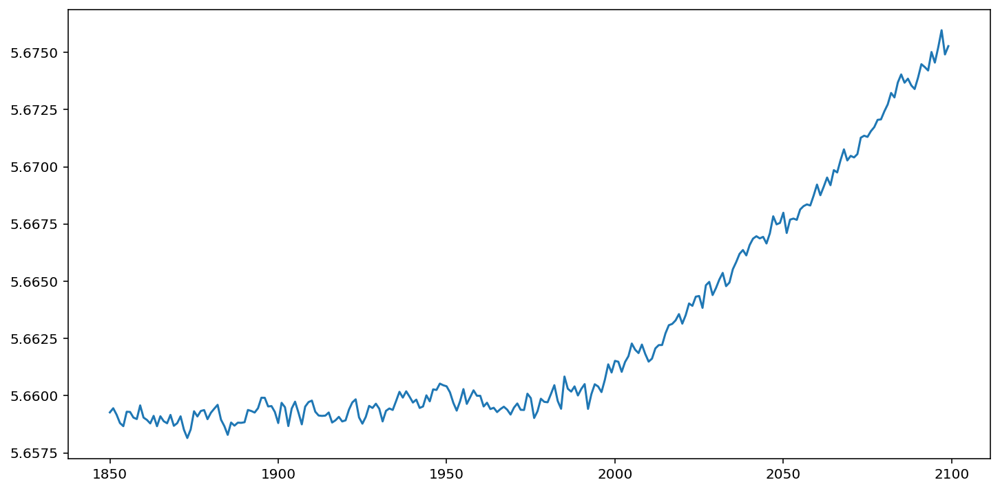

In [0]:
# Log will reduce the time series stationariy. so taking log
df_log = np.log(dftemp_mri)
plt.plot(df_log)

In [0]:
# function 
def get_stationarity(timeseries):
    
    # rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()
    
    # rolling statistics plot
    original = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolling_mean, color='red', label='Rolling Mean')
    std = plt.plot(rolling_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Dickey–Fuller test:
    result = adfuller(timeseries['mean_tas'])
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

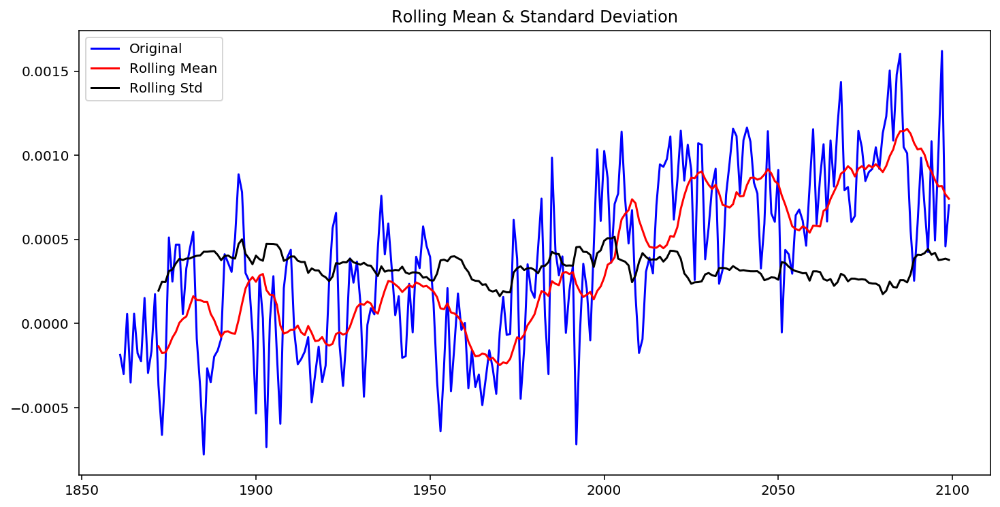

ADF Statistic: -1.634647571428051
p-value: 0.4650589386521797
Critical Values:
	1%: -3.4594900381360034
	5%: -2.8743581895178485
	10%: -2.573601605503697


In [0]:
# reducing rolling mean from log model
rolling_mean = df_log.rolling(window=12).mean()
df_log_minus_mean = df_log - rolling_mean
df_log_minus_mean.dropna(inplace=True)
get_stationarity(df_log_minus_mean)

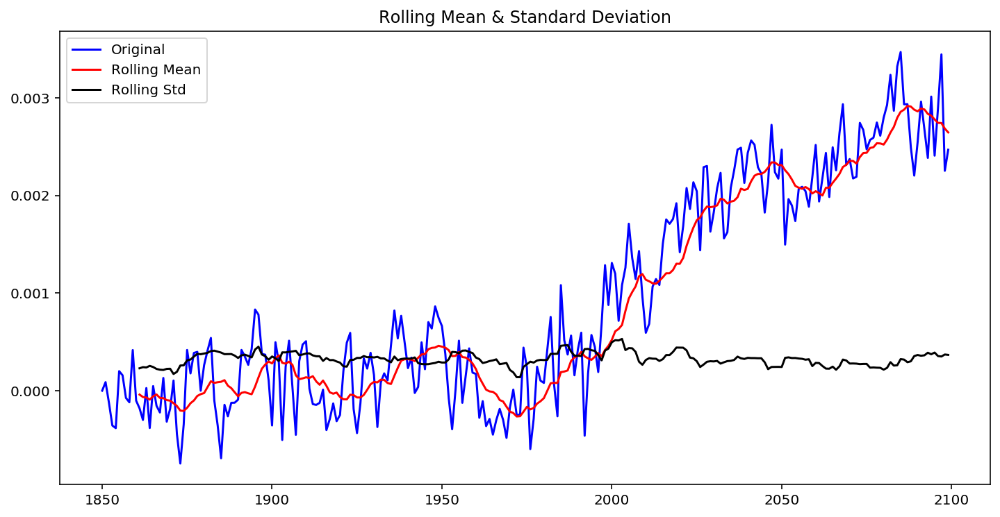

ADF Statistic: -0.82307576529344
p-value: 0.8122495904076517
Critical Values:
	1%: -3.4573260719088132
	5%: -2.873410402808354
	10%: -2.573095980841316


In [0]:
# Taking an expondential model
rolling_mean_exp_decay = df_log.ewm(halflife=12, min_periods=0, adjust=True).mean()
df_log_exp_decay = df_log - rolling_mean_exp_decay
df_log_exp_decay.dropna(inplace=True)
get_stationarity(df_log_exp_decay)

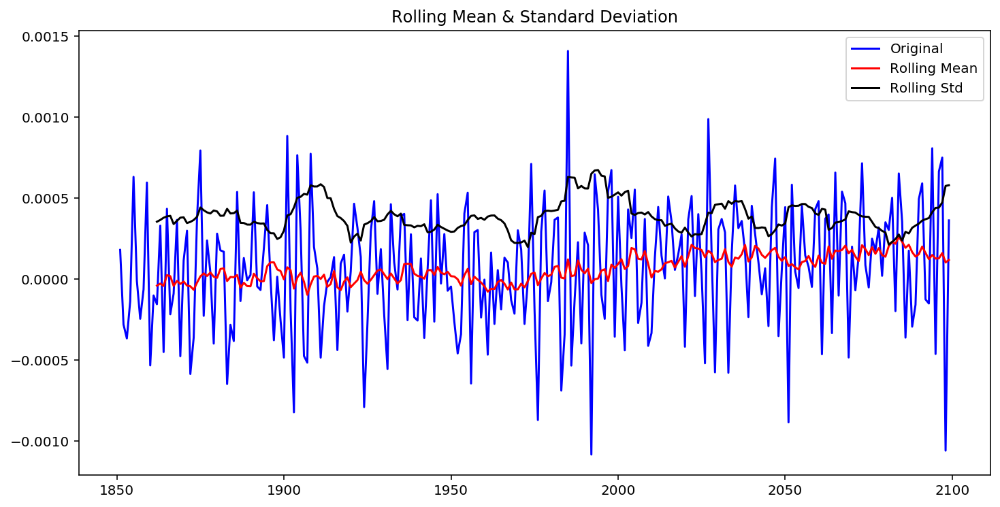

ADF Statistic: -10.6670285072048
p-value: 4.2612467816657455e-19
Critical Values:
	1%: -3.457215237265747
	5%: -2.873361841566324
	10%: -2.5730700760129555


In [0]:
# removing the shift from the log model
df_log_shift = df_log - df_log.shift()
df_log_shift.dropna(inplace=True)
get_stationarity(df_log_shift)

## Modelling Error Term from Regression of Temp(CESM2) OVER SSP 245


In [0]:
# Residual
res = pd.DataFrame(res)

In [0]:
# transpose the residual dataframe
resT = res.transpose()
resT.head()

,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas,mean_tas
0,-0.043805,-0.208513,-0.229430,-0.336360,-0.154856,-0.257834,0.040793,0.159230,-0.136444,-0.101991,-0.194112,-0.299890
1,-0.087811,-0.021776,-0.075042,-0.309139,-0.215769,-0.344748,-0.074487,-0.019176,-0.296417,-0.298737,-0.158529,-0.351617
2,-0.167695,-0.144278,-0.178576,-0.419252,-0.261528,-0.347442,-0.130415,-0.045709,-0.219405,-0.430015,-0.123196,-0.270482
3,-0.144874,-0.083132,-0.317478,-0.173146,-0.366582,-0.376397,-0.127382,-0.042852,-0.034068,-0.077710,-0.102785,-0.164268
4,-0.049715,-0.062799,-0.253212,-0.285372,-0.161642,-0.402997,0.040821,-0.189548,-0.047215,-0.036227,-0.150747,-0.123374


In [0]:
# Mean temperature
resT.sum()

mean_tas   -8.526513e-12
mean_tas   -6.025402e-12
mean_tas   -4.547474e-13
mean_tas   -1.057288e-11
mean_tas    2.728484e-12
mean_tas   -1.847411e-12
mean_tas    1.705303e-12
mean_tas   -5.911716e-12
mean_tas   -7.219114e-12
mean_tas   -2.273737e-13
mean_tas   -2.387424e-12
mean_tas   -6.139089e-12
dtype: float64

In [0]:
#resT.columns = ['CESM2','CESM2-WACCM','CNRM-CM6-1','CNRM-ESM2-1','CanESM5','GFDL-CM4','GFDL-ESM4','IPSL-CM6A-LR','MIROC-ES2L','MIROC6','MPI-ESM1-2-HR','MRI-ESM2-0']
#resT.rename(columns=lambda x: x[0:12], inplace=True)
#resT.head()

In [0]:
# subsetting the residual dataframe to model errors for the first regression
resTcesm2 = resT.iloc[:,0]
resTcesm2  = pd.DataFrame(resTcesm2)
resTcesm2.head()

,mean_tas
0,-0.043805
1,-0.087811
2,-0.167695
3,-0.144874
4,-0.049715


In [0]:
# changing index to years
year = pd.date_range('1850-01-01', periods=250, freq = 'Y')
year

DatetimeIndex(['1850-12-31', '1851-12-31', '1852-12-31', '1853-12-31',
               '1854-12-31', '1855-12-31', '1856-12-31', '1857-12-31',
               '1858-12-31', '1859-12-31',
               ...
               '2090-12-31', '2091-12-31', '2092-12-31', '2093-12-31',
               '2094-12-31', '2095-12-31', '2096-12-31', '2097-12-31',
               '2098-12-31', '2099-12-31'],
              dtype='datetime64[ns]', length=250, freq='A-DEC')

In [0]:
#changing index to years
resTcesm2["year"] = year
resTcesm2['year'] = pd.to_datetime(resTcesm2['year'])

In [0]:
# changing index to years
resTcesm2.set_index("year",inplace=True, drop=True)
resTcesm2.head()

,mean_tas
year,
1850-12-31,-0.043805
1851-12-31,-0.087811
1852-12-31,-0.167695
1853-12-31,-0.144874
1854-12-31,-0.049715


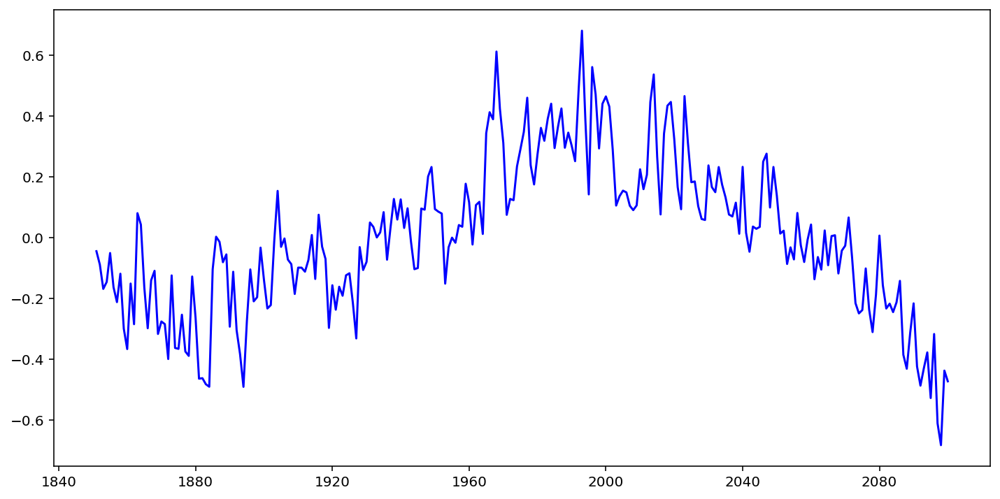

In [0]:
# plotting the residuals first
plt.plot(resTcesm2, color = 'blue', label = 'Original')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


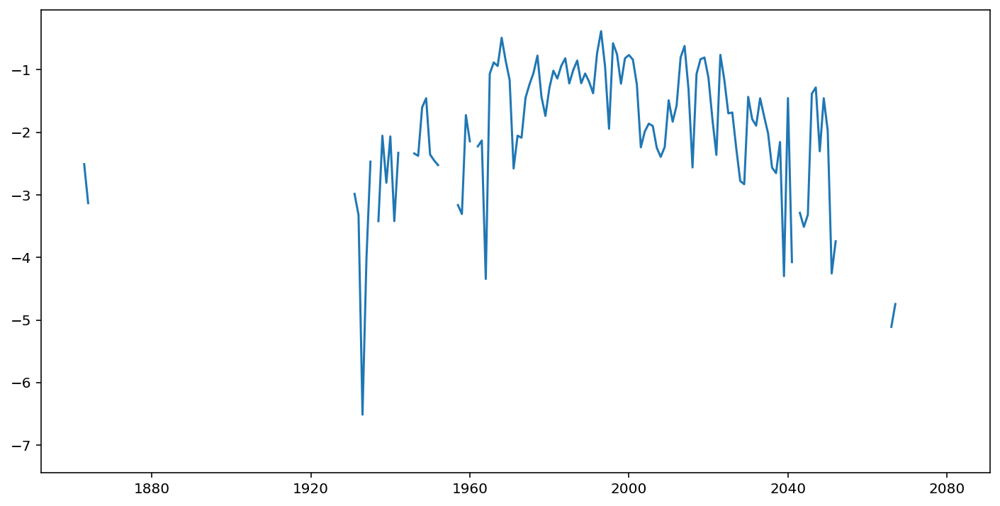

In [0]:
# Log will reduce the time series stationariy. so taking log
df_log = np.log(resTcesm2)
plt.plot(df_log)

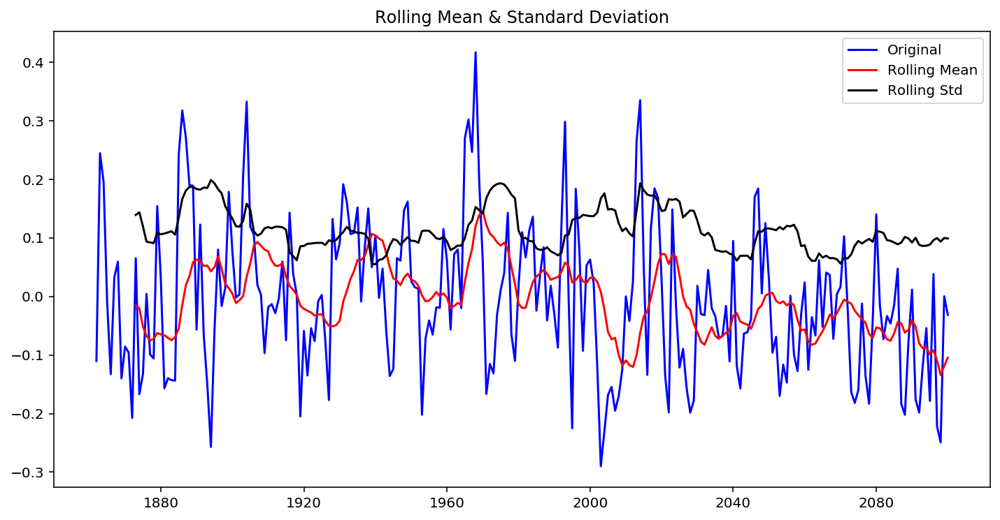

ADF Statistic: -6.15423048558819
p-value: 7.435251682972212e-08
Critical Values:
	1%: -3.4583663275730476
	5%: -2.8738660999177132
	10%: -2.5733390785693766


In [0]:
# taking the rolling mean out
rolling_mean = resTcesm2.rolling(window=12).mean()
df_minus_mean = resTcesm2  - rolling_mean
df_minus_mean.dropna(inplace=True)
get_stationarity(df_minus_mean)

In [0]:
# mean of rolling mean
rolling_mean.mean()

mean_tas    0.014194
dtype: float64

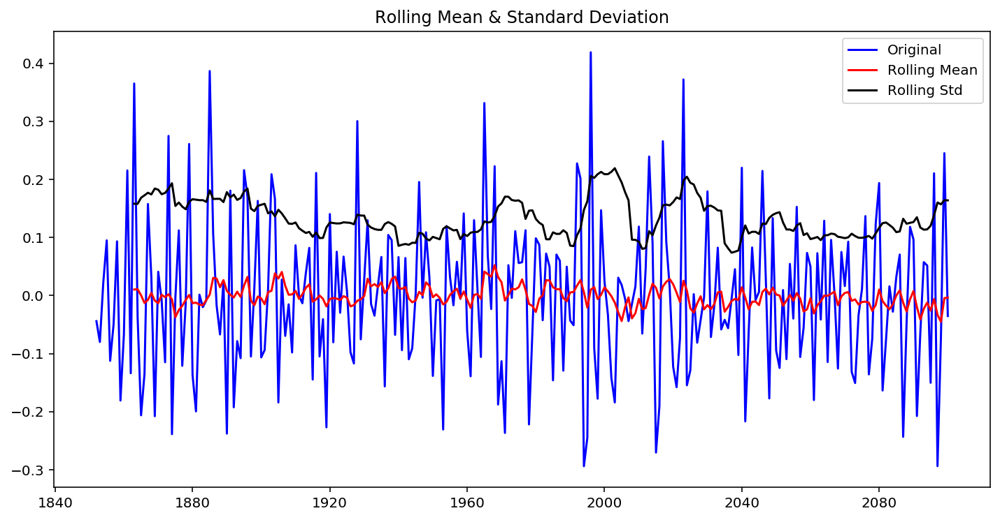

ADF Statistic: -8.684823922226542
p-value: 4.190861811079585e-14
Critical Values:
	1%: -3.4577787098622674
	5%: -2.873608704758507
	10%: -2.573201765981991


In [0]:
# plotting the rolling mean and standard deviation
df_shift = resTcesm2 - resTcesm2.shift()
df_shift.dropna(inplace=True)
get_stationarity(df_shift)

In [0]:
resTcesm2.head()

,mean_tas
year,
1850-12-31,-0.043805
1851-12-31,-0.087811
1852-12-31,-0.167695
1853-12-31,-0.144874
1854-12-31,-0.049715


In [0]:
resTcesm2.dropna(inplace=True)
resTcesm2.head()

,mean_tas
year,
1850-12-31,-0.043805
1851-12-31,-0.087811
1852-12-31,-0.167695
1853-12-31,-0.144874
1854-12-31,-0.049715


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency A-DEC will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:               mean_tas   No. Observations:                  250
Model:                     ARMA(2, 0)   Log Likelihood                 161.608
Method:                       css-mle   S.D. of innovations              0.126
Date:                Tue, 18 Feb 2020   AIC                           -315.216
Time:                        04:16:02   BIC                           -301.130
Sample:                    12-31-1850   HQIC                          -309.547
                         - 12-31-2099                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0173      0.067     -0.259      0.796      -0.149       0.114
ar.L1.mean_tas     0.7287      0.062     11.694      0.000       0.607       0.851
ar.L2.mean_tas     0.1557      0.063

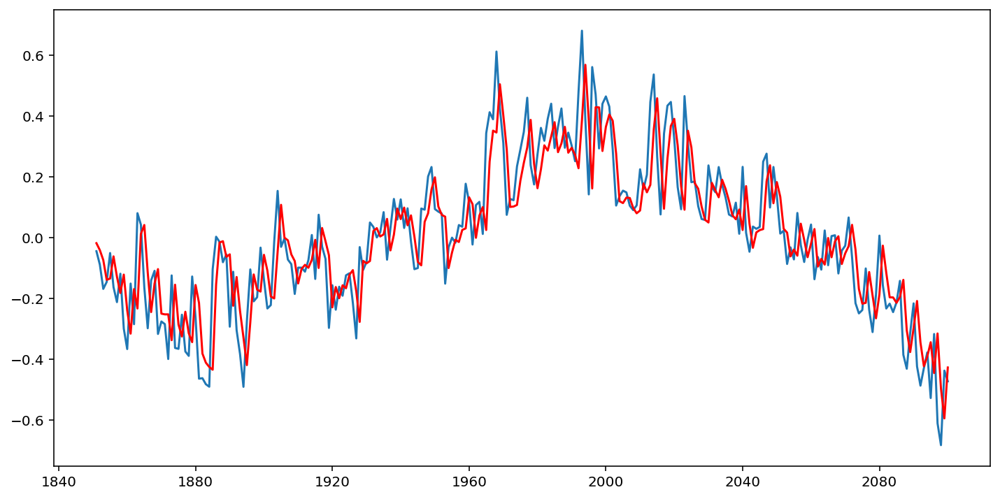

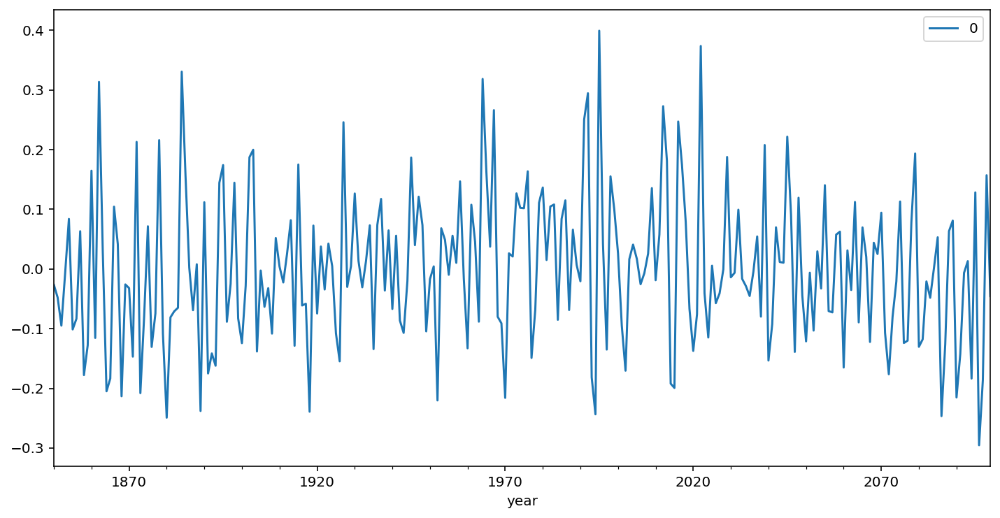

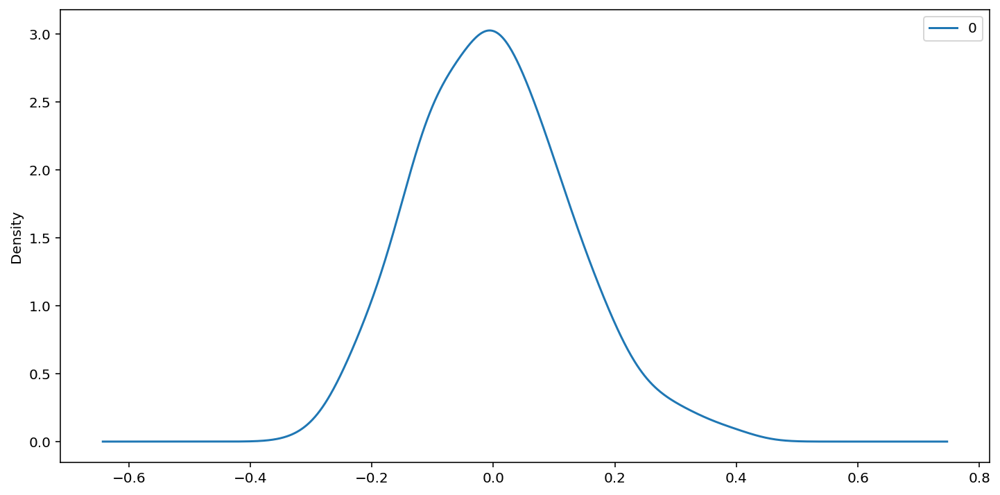

                0
count  250.000000
mean     0.000152
std      0.126676
min     -0.295424
25%     -0.088424
50%     -0.006280
75%      0.077147
max      0.399378


In [0]:
#Modelling the error - AR model- 2 step
decomposition = seasonal_decompose(resTcesm2) 
model = ARIMA(resTcesm2, order=(2,0,0))
results = model.fit(disp=-1)
print(results.summary())
plt.plot(resTcesm2)
plt.plot(results.fittedvalues, color='red')
# plot residual errors
residuals = pd.DataFrame(results.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency A-DEC will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:               mean_tas   No. Observations:                  250
Model:                     ARMA(1, 0)   Log Likelihood                 158.562
Method:                       css-mle   S.D. of innovations              0.128
Date:                Mon, 17 Feb 2020   AIC                           -311.124
Time:                        16:54:59   BIC                           -300.559
Sample:                    12-31-1850   HQIC                          -306.872
                         - 12-31-2099                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0123      0.057     -0.214      0.831      -0.125       0.100
ar.L1.mean_tas     0.8619      0.032     26.808      0.000       0.799       0.925
                                    

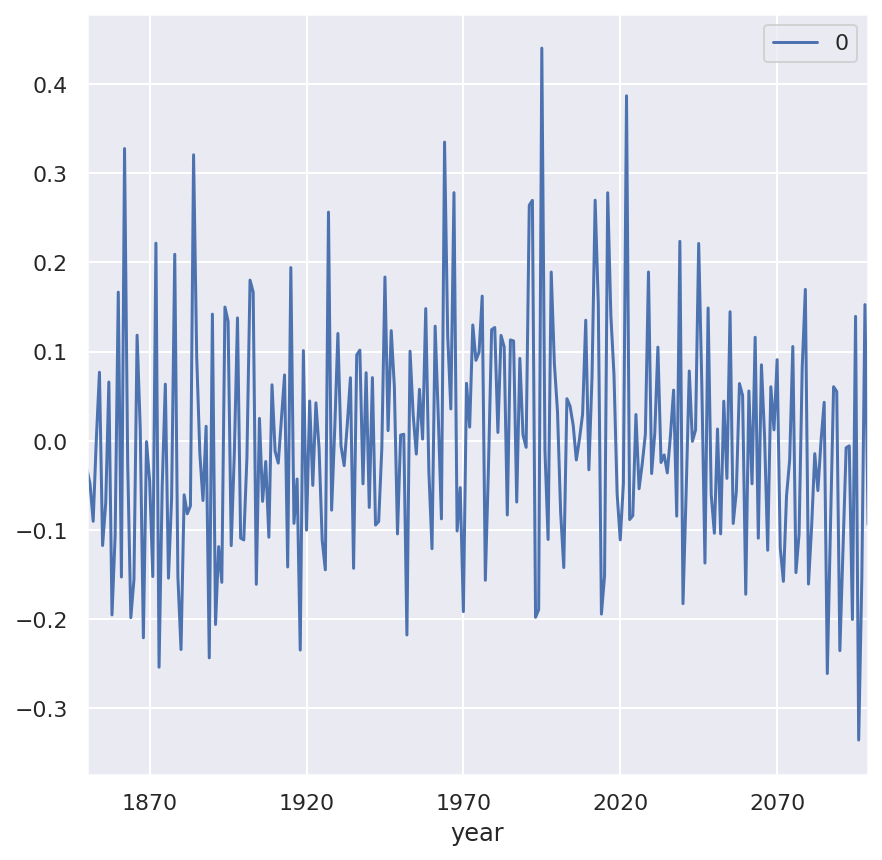

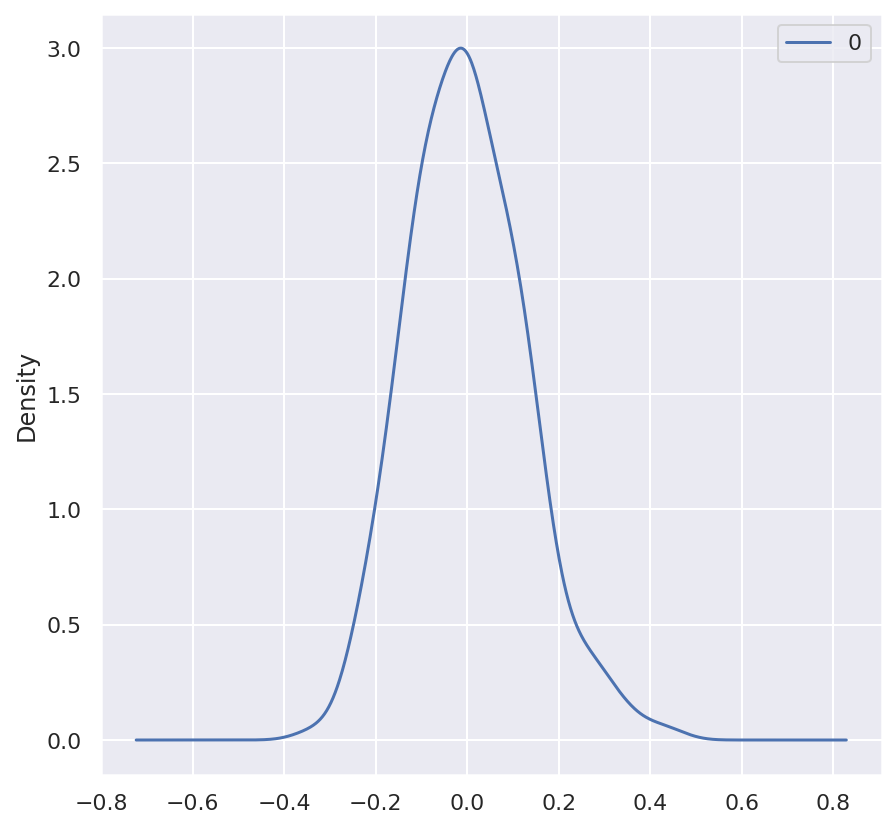

                0
count  250.000000
mean     0.000109
std      0.128246
min     -0.335641
25%     -0.092744
50%     -0.006608
75%      0.081403
max      0.440371


In [0]:
# Modelling the error term- AR-1 step
from matplotlib import pyplot
model = ARIMA(resTcesm2, order=(1,0,0))
model_fit = model.fit(disp=0)
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

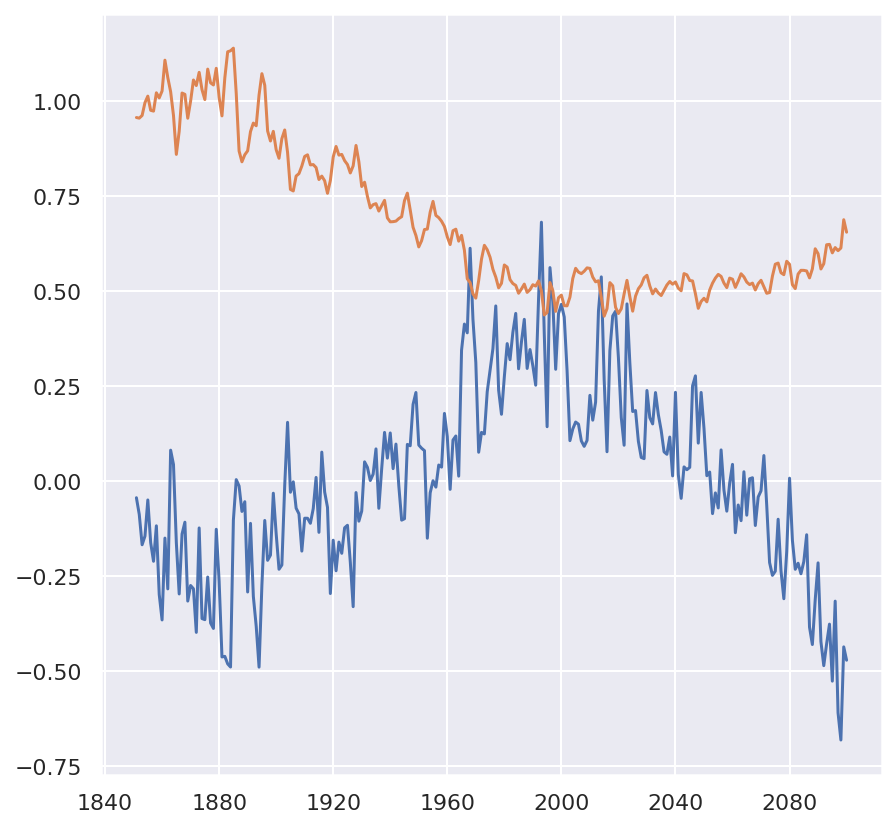

In [0]:
predictions_ARIMA_diff = pd.Series(results.fittedvalues, copy=True)
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
predictions_ARIMA_log = pd.Series(resTcesm2['mean_tas'].iloc[0], index=resTcesm2.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
predictions_ARIMA = np.exp(predictions_ARIMA_log)
plt.plot(resTcesm2)
plt.plot(predictions_ARIMA)

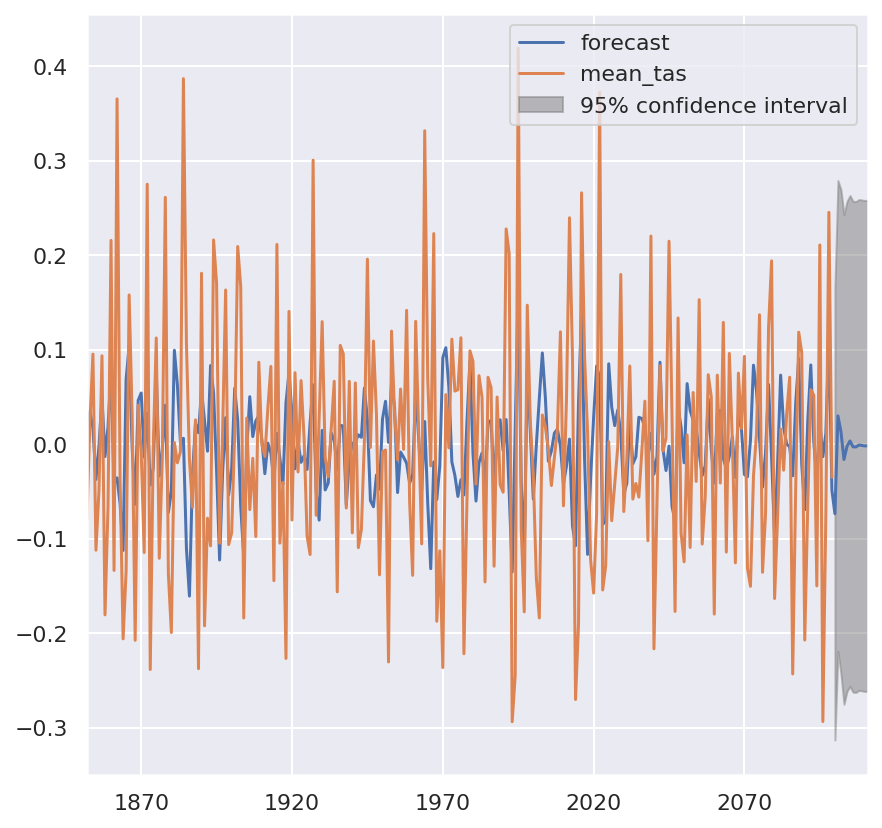

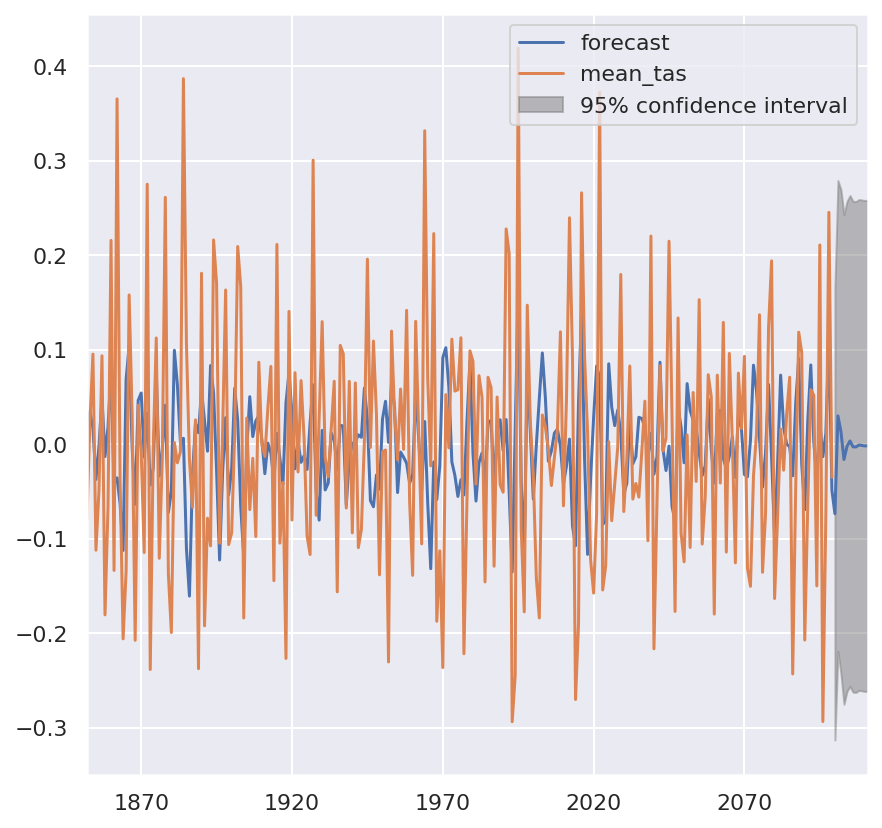

In [0]:
results.plot_predict(1,260)

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency A-DEC will be used.
  % freq, ValueWarning)


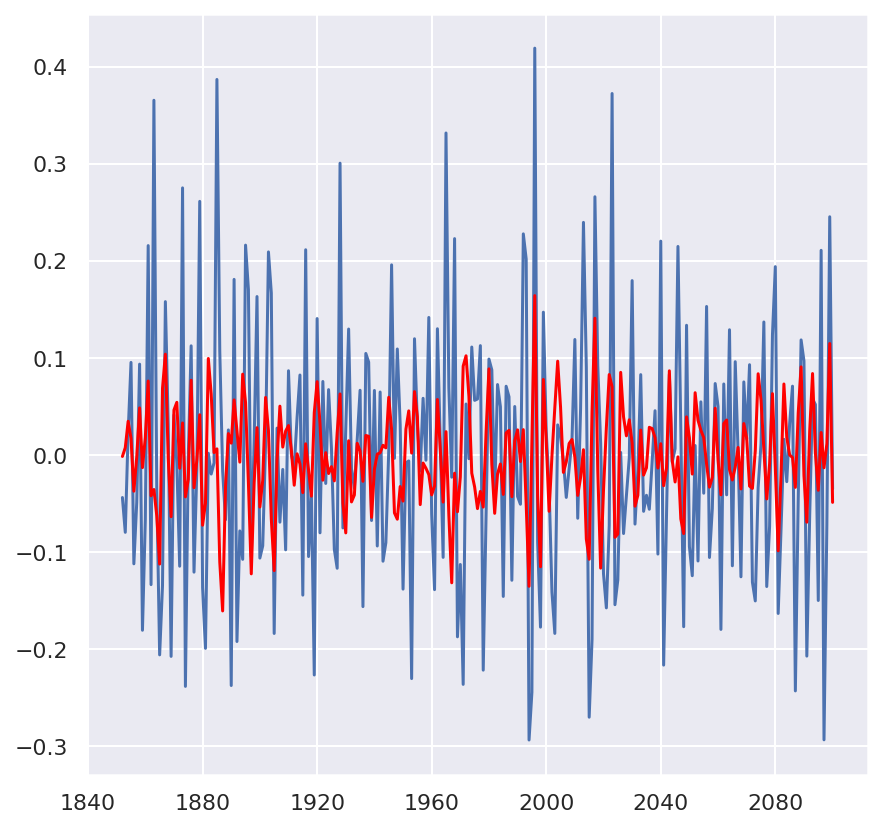

In [0]:

# Modlling with df_shift
decomposition = seasonal_decompose(df_shift) 
model = ARIMA(df_shift, order=(2,0,0))
results = model.fit(disp=-1)
plt.plot(df_shift)
plt.plot(results.fittedvalues, color='red')

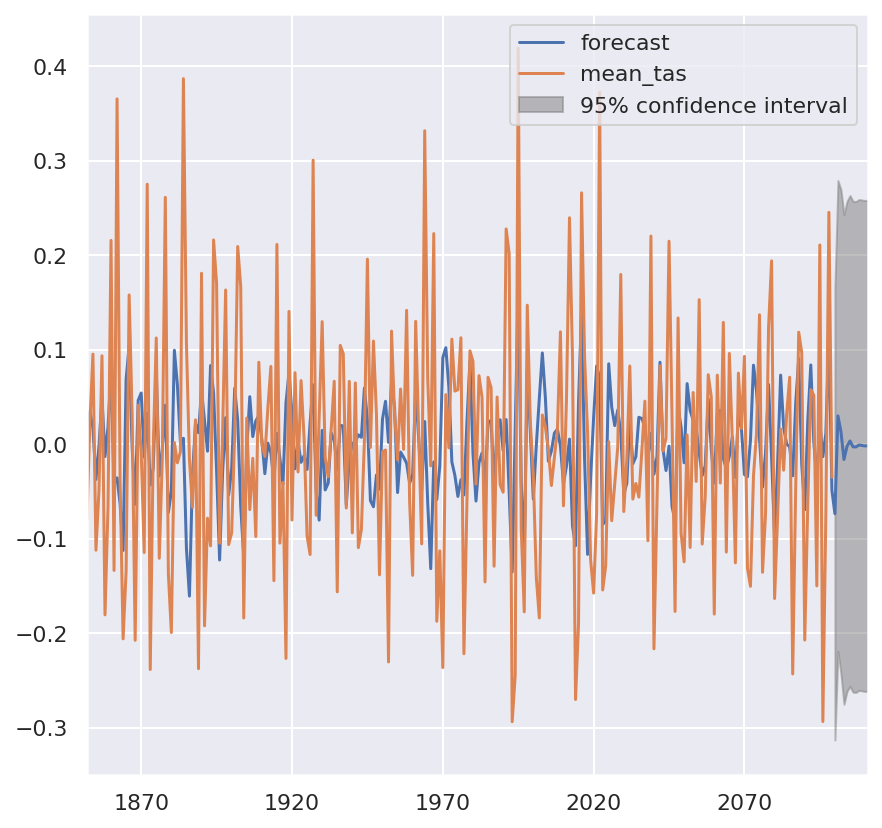

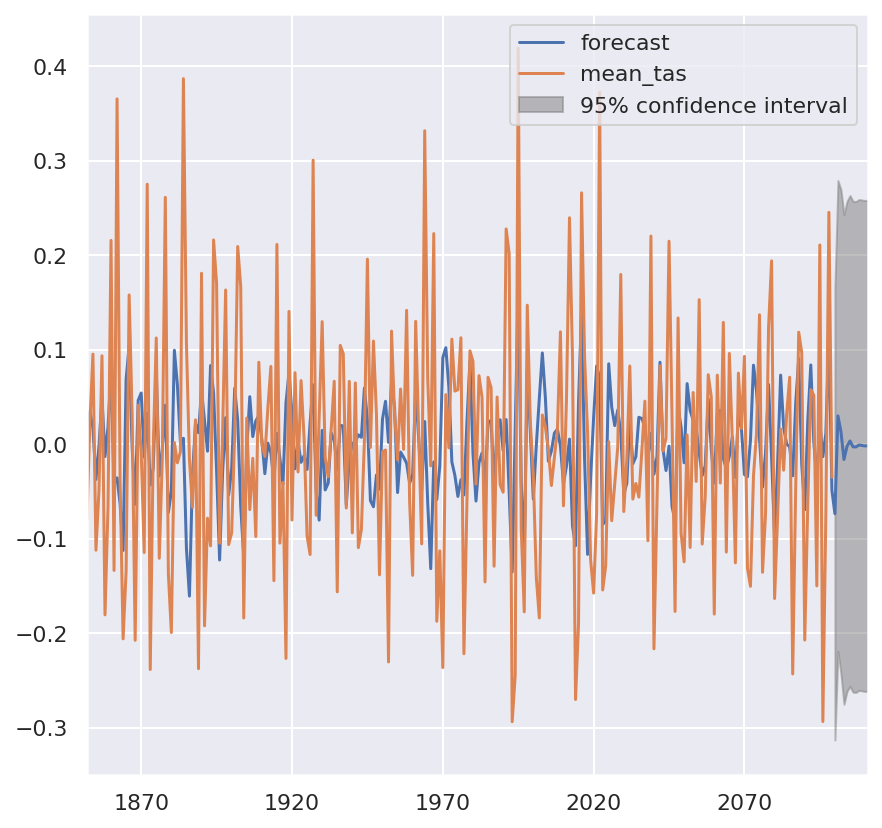

In [0]:
results.plot_predict(1,260)

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency A-DEC will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:               mean_tas   No. Observations:                  249
Model:                     ARMA(2, 0)   Log Likelihood                 170.015
Method:                       css-mle   S.D. of innovations              0.122
Date:                Tue, 18 Feb 2020   AIC                           -332.030
Time:                        04:27:52   BIC                           -317.960
Sample:                    12-31-1851   HQIC                          -326.367
                         - 12-31-2099                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0017      0.005     -0.362      0.717      -0.011       0.008
ar.L1.mean_tas    -0.2853      0.060     -4.773      0.000      -0.402      -0.168
ar.L2.mean_tas    -0.3301      0.060

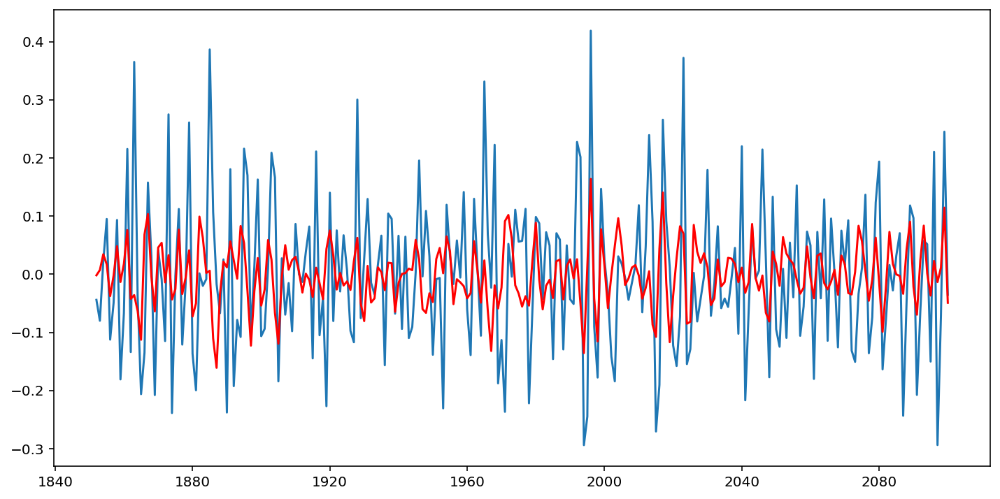

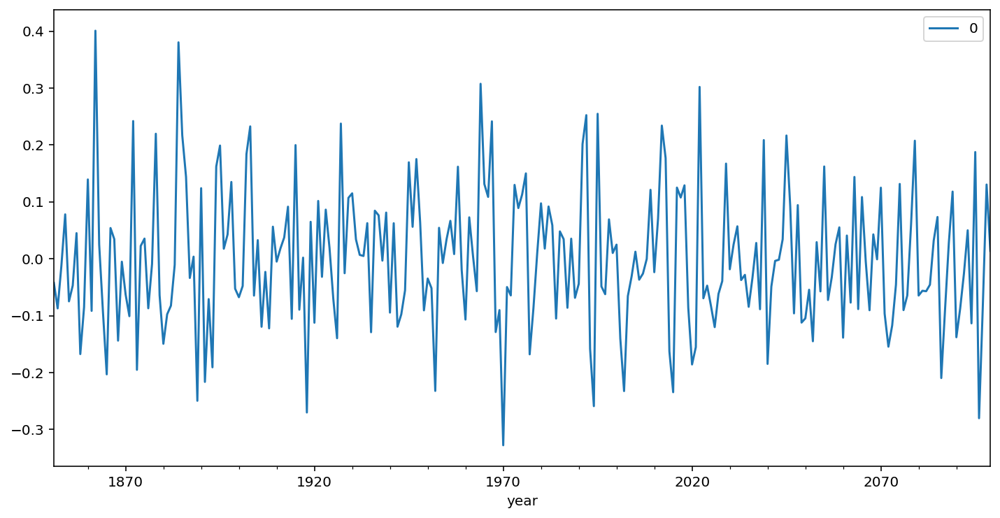

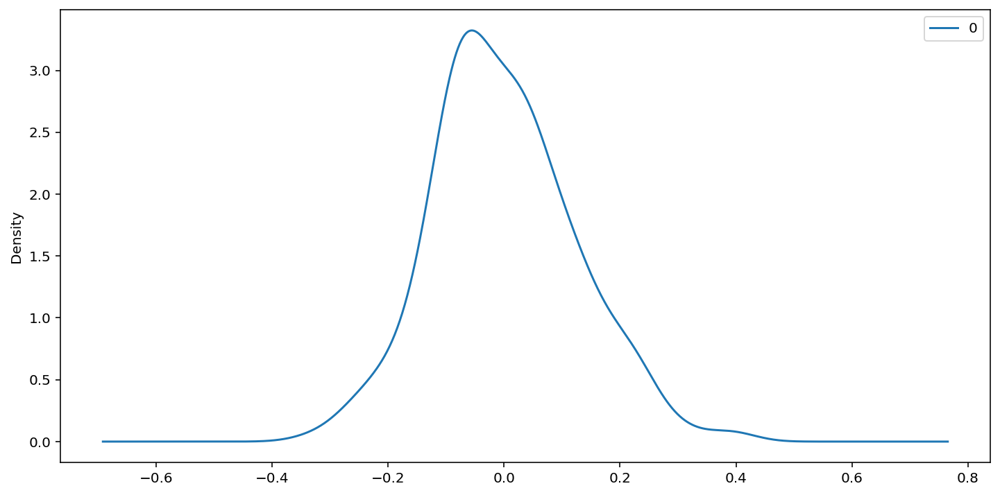

                0
count  249.000000
mean    -0.000196
std      0.122441
min     -0.327867
25%     -0.086121
50%     -0.007416
75%      0.072873
max      0.401018


In [0]:
# Modelling with shift
from matplotlib import pyplot
model = ARIMA(df_shift, order=(2,0,0))
plt.plot(df_shift)
model_fit = model.fit(disp=0)
print(model_fit.summary())
plt.plot(model_fit.fittedvalues, color='red')
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency A-DEC will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:               mean_tas   No. Observations:                  239
Model:                     ARMA(2, 0)   Log Likelihood                 185.819
Method:                       css-mle   S.D. of innovations              0.111
Date:                Tue, 18 Feb 2020   AIC                           -363.637
Time:                        04:33:44   BIC                           -349.731
Sample:                    12-31-1861   HQIC                          -358.034
                         - 12-31-2099                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0072      0.013     -0.544      0.587      -0.033       0.019
ar.L1.mean_tas     0.5246      0.065      8.071      0.000       0.397       0.652
ar.L2.mean_tas    -0.0623      0.065

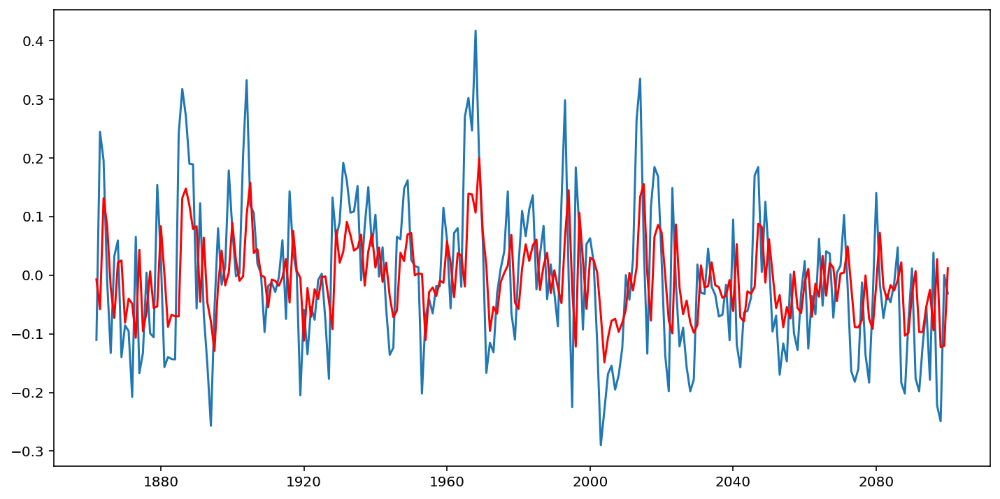

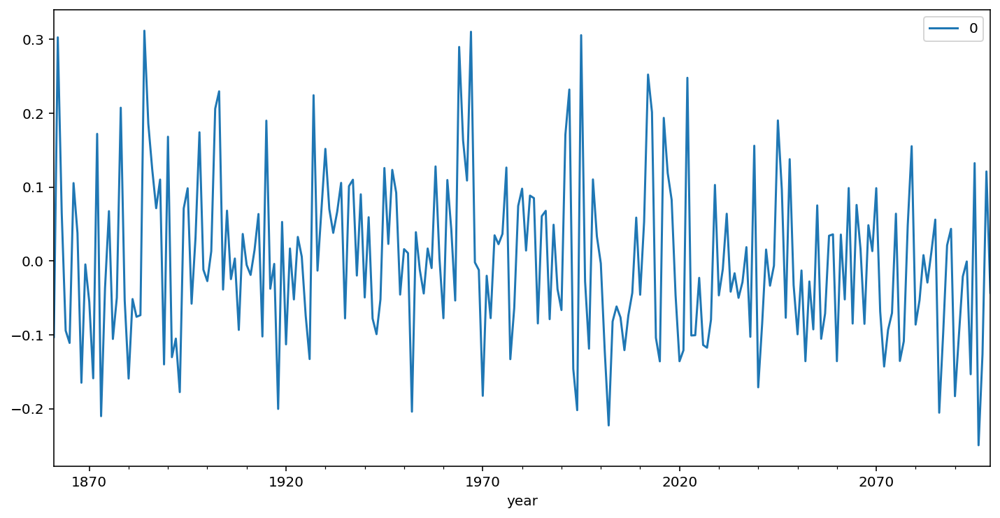

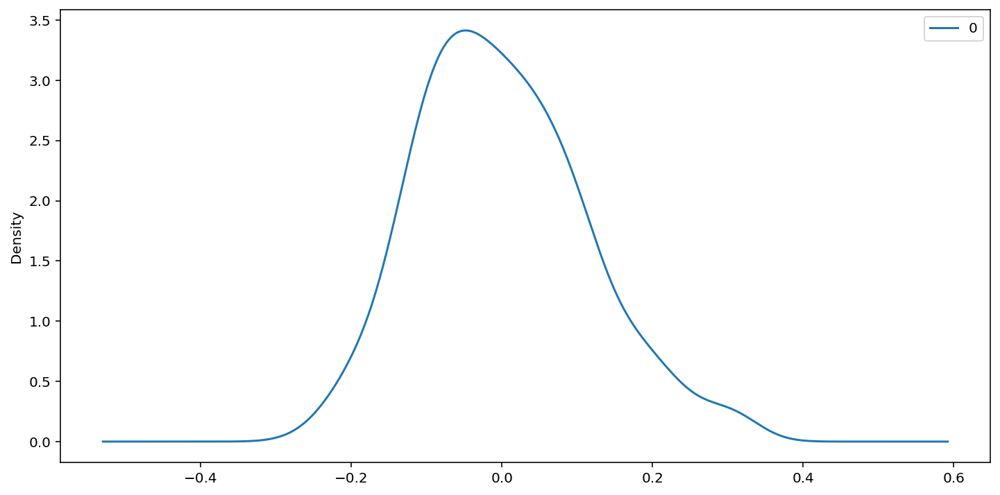

                0
count  239.000000
mean     0.000252
std      0.111423
min     -0.249552
25%     -0.079259
50%     -0.011866
75%      0.068869
max      0.311632


In [0]:
# Modelling with shift
from matplotlib import pyplot
model = ARIMA(df_minus_mean, order=(2,0,0))
plt.plot(df_minus_mean)
model_fit = model.fit(disp=0)
print(model_fit.summary())
plt.plot(model_fit.fittedvalues, color='red')
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())